In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import json
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import random
import seaborn as sns
from networkx.algorithms.clique import graph_number_of_cliques
from networkx.algorithms.community import greedy_modularity_communities
from itertools import combinations

In [ ]:
def draw(G, pos, measures, measure_name, with_labels):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1))
    
    if with_labels:
      labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()


def extract_nodes_and_edges(graph, dataset_file):
  
  data = json.load(open(dataset_file))

  for node in data["nodes"]:
    graph.add_node(node["name"], value=node["value"])

  for edge in data["links"]:
    graph.add_edge(data["nodes"][edge["source"]]["name"], data["nodes"][edge["target"]]["name"], weight=edge["value"])


def get_subgraph(G, NG, threshold):
  edges = [(u,v,d) for u,v,d in G.edges(data = True) if d['weight'] > threshold]
  NG.add_edges_from(edges)

In [ ]:
dataset_file_mentions = "/content/drive/MyDrive/Progetto Data Science - Social Network Analysis/Dataset Star Wars/starwars-full-mentions.json"
dataset_interactions_ep1 = "/content/drive/MyDrive/Progetto Data Science - Social Network Analysis/Dataset Star Wars/starwars-episode-1-interactions.json"
dataset_interactions_ep2 = "/content/drive/MyDrive/Progetto Data Science - Social Network Analysis/Dataset Star Wars/starwars-episode-2-interactions.json"
dataset_interactions_ep3 = "/content/drive/MyDrive/Progetto Data Science - Social Network Analysis/Dataset Star Wars/starwars-episode-3-interactions.json"
dataset_interactions_ep4 = "/content/drive/MyDrive/Progetto Data Science - Social Network Analysis/Dataset Star Wars/starwars-episode-4-interactions.json"
dataset_interactions_ep5 = "/content/drive/MyDrive/Progetto Data Science - Social Network Analysis/Dataset Star Wars/starwars-episode-5-interactions.json"
dataset_interactions_ep6 = "/content/drive/MyDrive/Progetto Data Science - Social Network Analysis/Dataset Star Wars/starwars-episode-6-interactions.json"

# **Analisi Grafo sulle Menzioni**

## Rappresentazione del grafo e delle sue caratteristiche


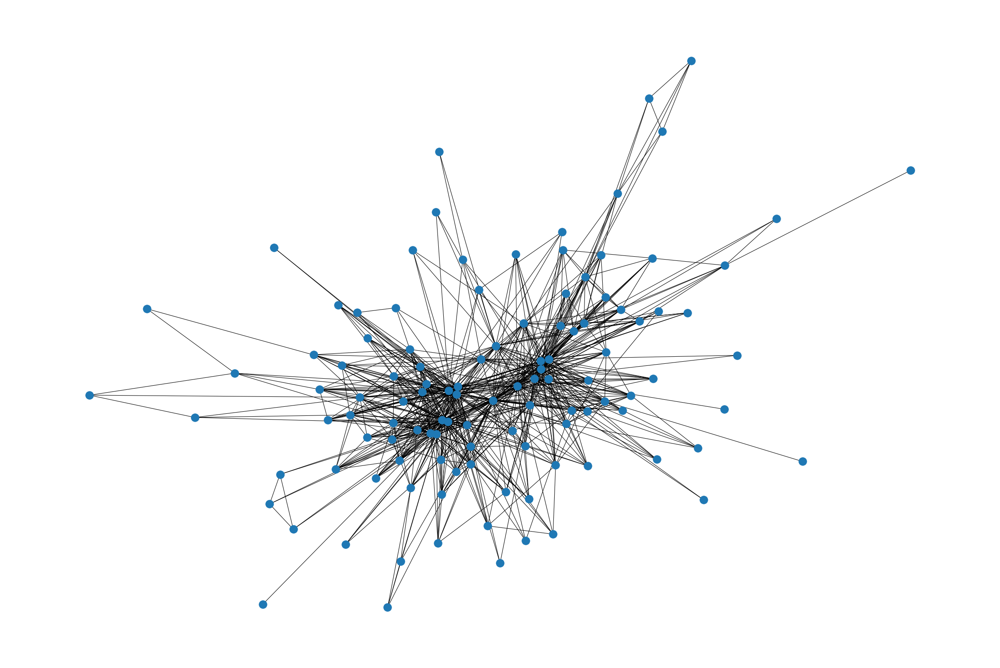

In [ ]:
graph_mentions = nx.Graph()
extract_nodes_and_edges(graph_mentions, dataset_file_mentions)
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(graph_mentions, with_labels=False)

In [ ]:
print("Numero di nodi:"+str(graph_mentions.number_of_nodes()))
print("Numero di archi:"+str(graph_mentions.number_of_edges()))
print("Raggio:"+str(nx.radius(graph_mentions)))
print("Diametro:"+str(nx.diameter(graph_mentions)))
print("Periferia:"+str(nx.periphery(graph_mentions)))
print("Centro:"+str(nx.center(graph_mentions)))

Numero di nodi:113
Numero di archi:817
Raggio:3
Diametro:5
Periferia:['DOFINE', 'TEY HOW', 'TARPALS', 'YOLO ZIFF', 'COLONEL DATOO', 'ELLO ASTY', 'NIV LEK']
Centro:['OBI-WAN', 'YODA', 'EMPEROR', 'PADME', 'R2-D2', 'ANAKIN', 'C-3PO', 'GREEDO', 'JABBA', 'BAIL ORGANA', 'BOBA FETT', 'SNAP', 'BERU', 'OWEN', 'RED LEADER', 'MON MOTHMA', 'DARTH VADER', 'CHEWBACCA', 'CAPTAIN ANTILLES', 'LUKE', 'LEIA', 'YOUNG GIRL', 'BIGGS', 'HAN', 'WEDGE', 'GOLD LEADER', 'DODONNA', 'PIETT', 'LANDO', 'BIB FORTUNA', 'BOUSHH', 'ADMIRAL ACKBAR', 'KYLO REN', 'REY']


Eccentricità: 



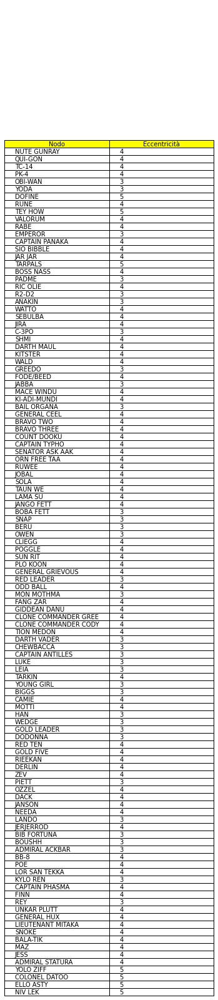

In [ ]:
print("Eccentricità: \n")
column_labels=["Nodo","Eccentricità"]
fig , ax = plt.subplots(1,1)
ax.axis('tight')
ax.axis('off')
data=list(nx.eccentricity(graph_mentions).items())
ax.table(data,colLabels=column_labels,cellLoc="left",colColours=["yellow"]*2)
plt.show()

Degree: 



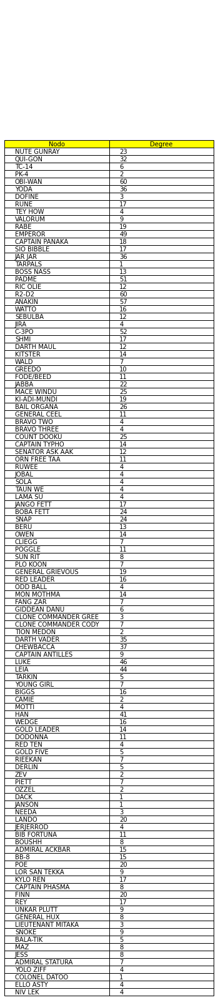

In [ ]:
print("Degree: \n")
column_labels=["Nodo","Degree"]
fig , ax = plt.subplots(1,1)
ax.axis('tight')
ax.axis('off')
data=list(graph_mentions.degree)
ax.table(data,colLabels=column_labels,cellLoc="left",colColours=["yellow"]*2)
plt.show()

Clustering: 



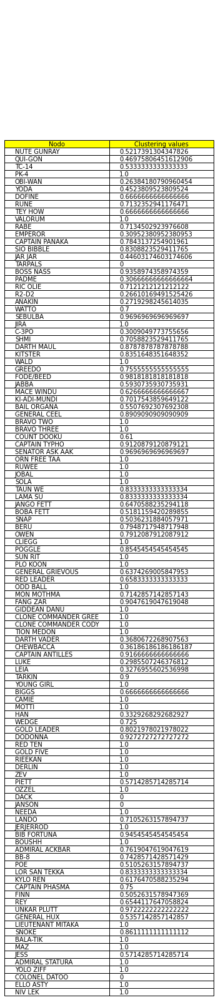

In [ ]:
print("Clustering: \n")
column_labels=["Nodo","Clustering values"]
fig , ax = plt.subplots(1,1)
ax.axis('tight')
ax.axis('off')
data=list(nx.clustering(graph_mentions).items())
ax.table(data,colLabels=column_labels,cellLoc="left",colColours=["yellow"]*2)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 <a list of 10 Text major ticklabel objects>)

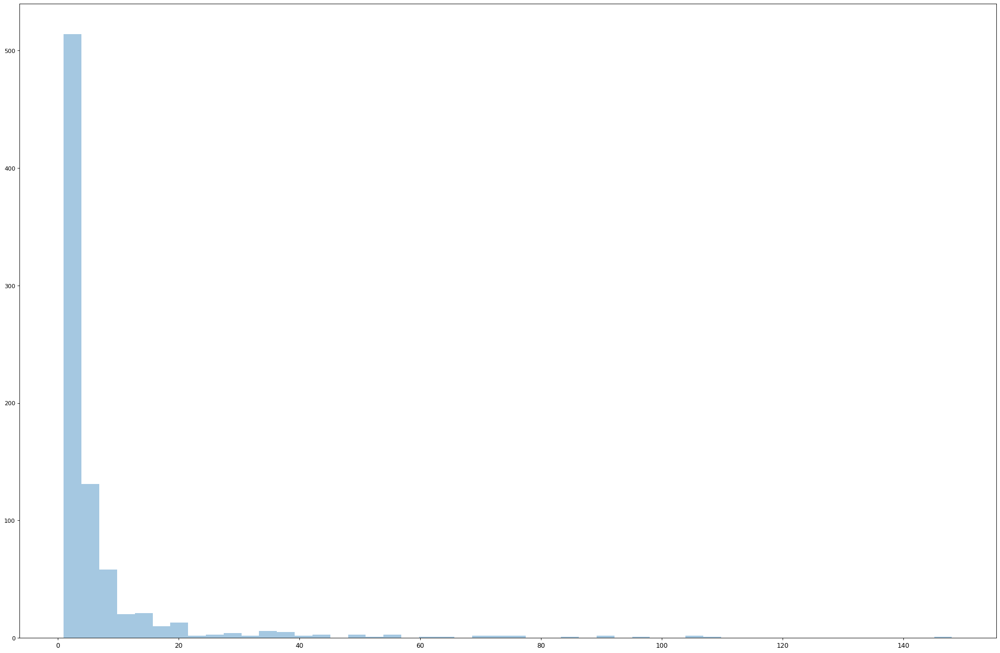

In [ ]:
p=nx.get_edge_attributes(graph_mentions,"weight")
plt.figure(num=None, figsize=(30, 20), dpi=80)
sns.distplot(list(p.values()), kde=False)
plt.xticks(fontsize=11)

## Analisi delle centralità

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


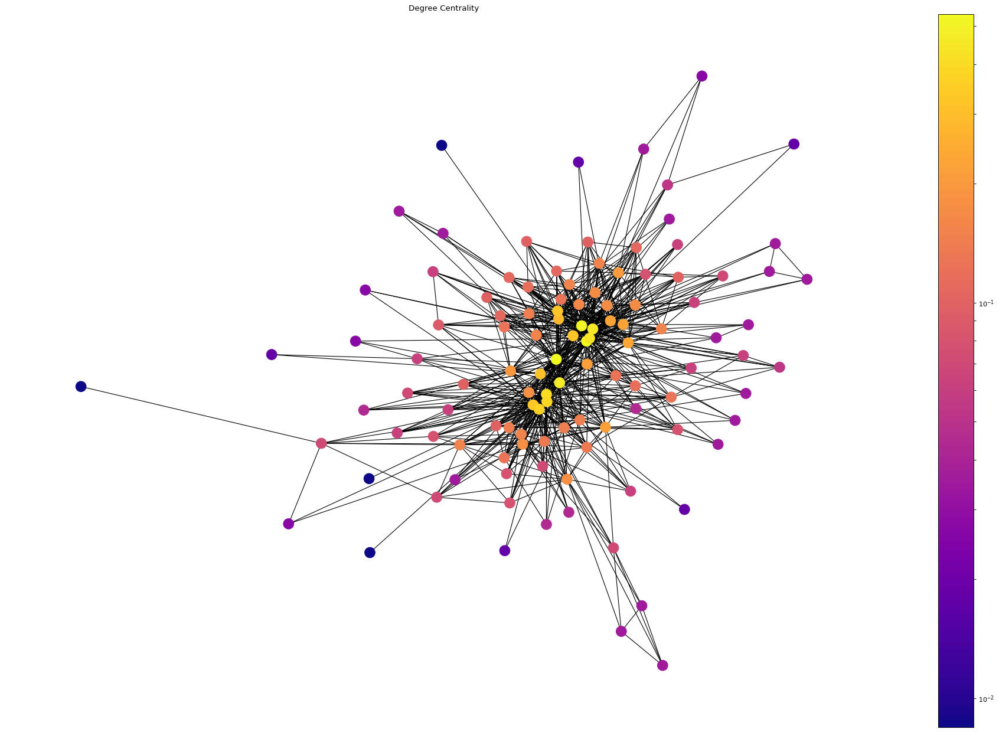

In [ ]:
pos = nx.spring_layout(graph_mentions)
plt.figure(num=None, figsize=(30, 20), dpi=80)
degree = nx.degree_centrality(graph_mentions)
draw(graph_mentions, pos, degree, 'Degree Centrality', False)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(array([-0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6]),
 <a list of 8 Text major ticklabel objects>)

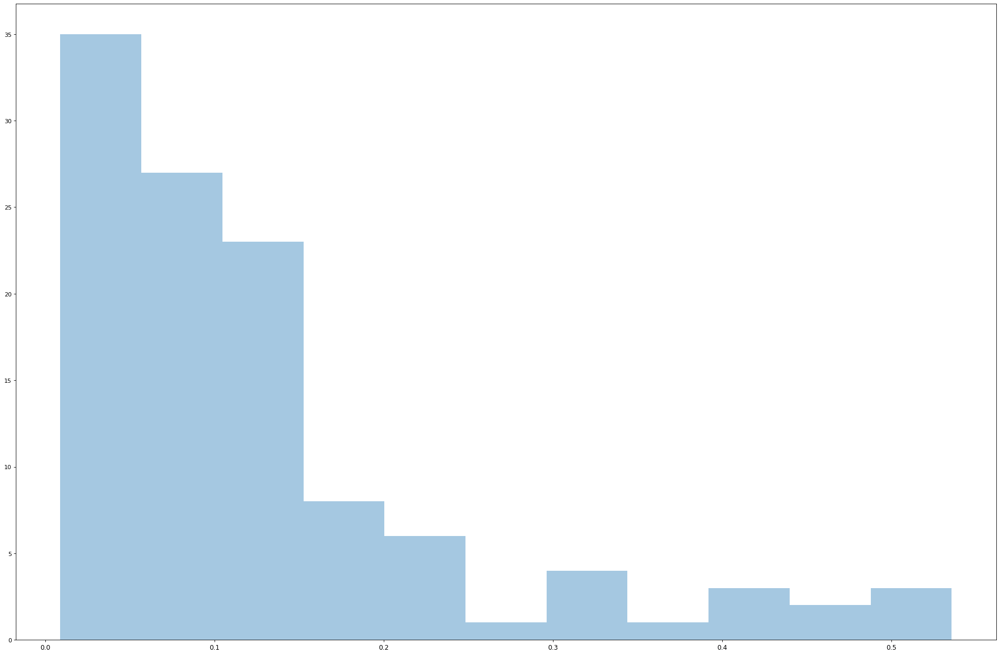

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
sns.distplot(list(degree.values()), kde=False)
plt.xticks(fontsize=11)

In [ ]:
degree_sorted=sorted(degree.items(), key= lambda x: x[1], reverse = True)
for i in range(10):
  print(degree_sorted[i])

('OBI-WAN', 0.5357142857142857)
('R2-D2', 0.5357142857142857)
('ANAKIN', 0.5089285714285714)
('C-3PO', 0.46428571428571425)
('PADME', 0.45535714285714285)
('EMPEROR', 0.4375)
('LUKE', 0.4107142857142857)
('LEIA', 0.39285714285714285)
('HAN', 0.36607142857142855)
('CHEWBACCA', 0.33035714285714285)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


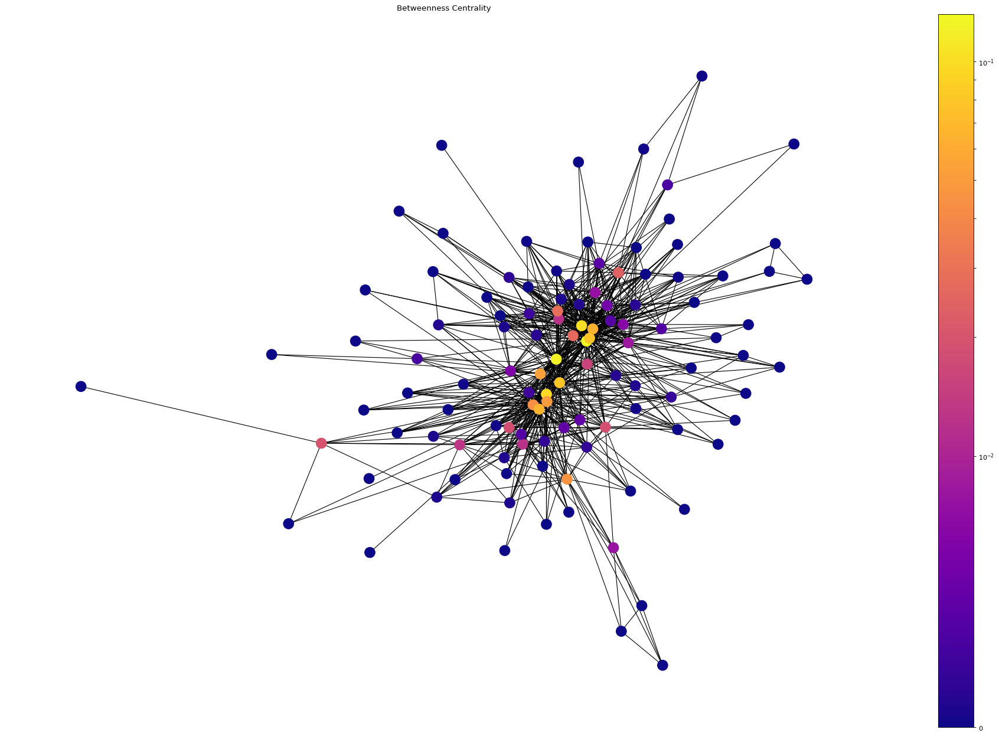

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
bet = nx.betweenness_centrality(graph_mentions)
draw(graph_mentions, pos, bet, 'Betweenness Centrality', False)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(array([-0.02,  0.  ,  0.02,  0.04,  0.06,  0.08,  0.1 ,  0.12,  0.14]),
 <a list of 9 Text major ticklabel objects>)

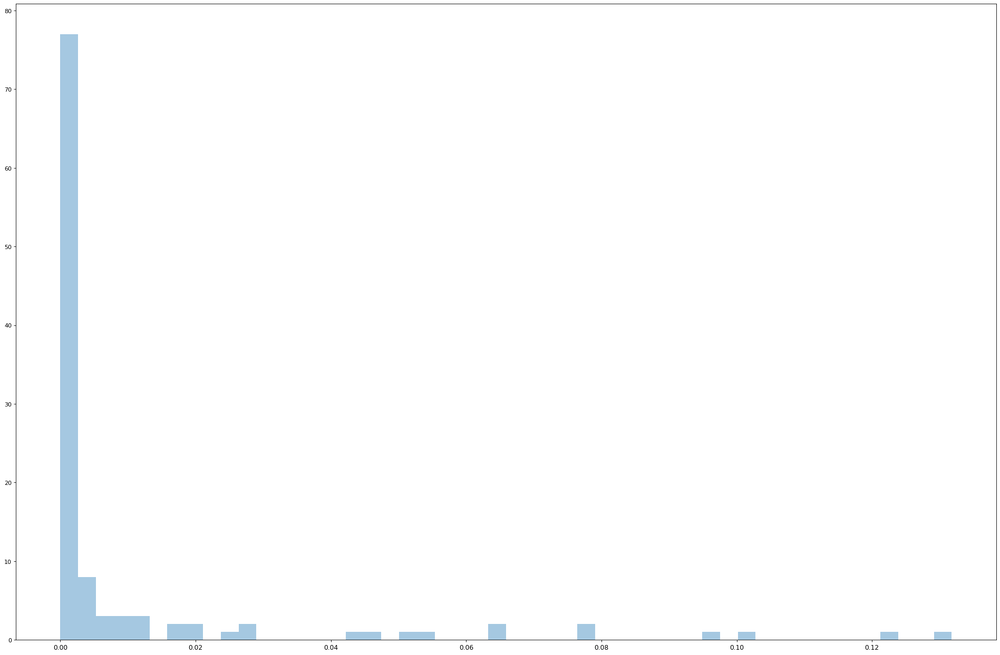

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
sns.distplot(list(bet.values()), kde=False)
plt.xticks(fontsize=11)

In [ ]:
bet_sorted=sorted(bet.items(), key= lambda x: x[1], reverse = True)
for i in range(10):
  print(bet_sorted[i])

('OBI-WAN', 0.13177676434913627)
('R2-D2', 0.12155398407326098)
('ANAKIN', 0.10195300988886925)
('LUKE', 0.09704921599369244)
('C-3PO', 0.07848491132995239)
('EMPEROR', 0.07749154665280958)
('HAN', 0.06568760964847291)
('PADME', 0.06540341817019706)
('DARTH VADER', 0.0532146088739358)
('LEIA', 0.05024881578153231)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


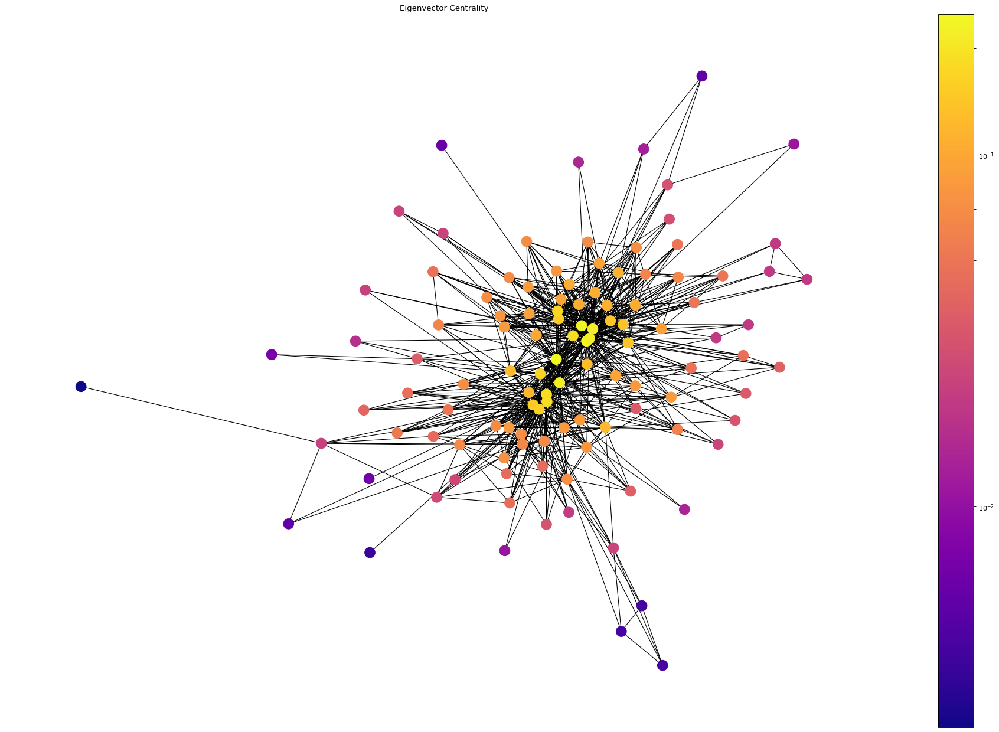

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
eig = nx.eigenvector_centrality(graph_mentions)
draw(graph_mentions, pos, eig, 'Eigenvector Centrality', False)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(array([-0.05,  0.  ,  0.05,  0.1 ,  0.15,  0.2 ,  0.25,  0.3 ]),
 <a list of 8 Text major ticklabel objects>)

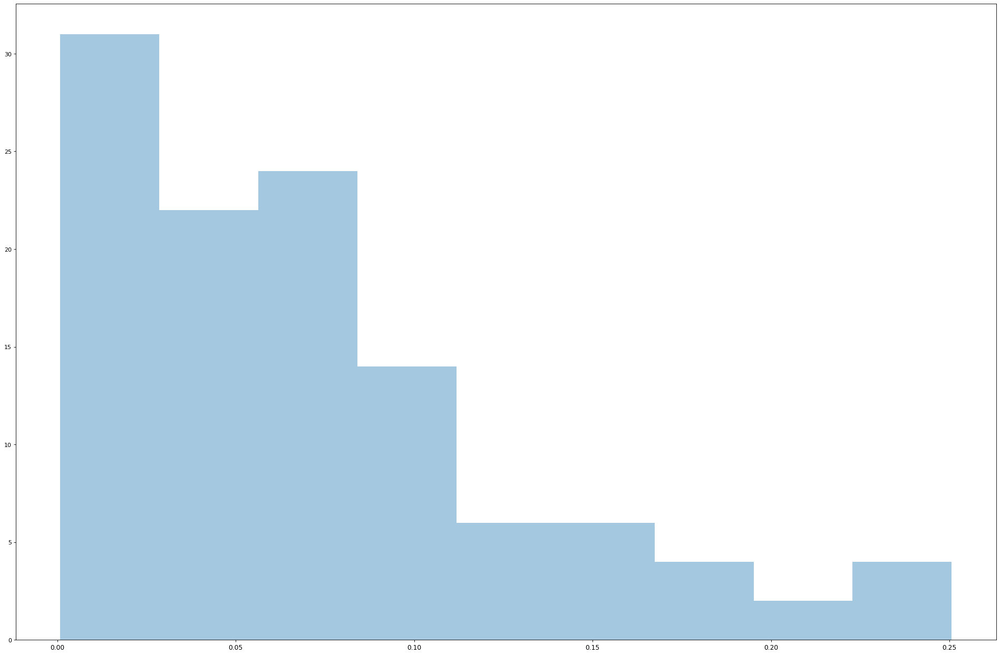

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
sns.distplot(list(eig.values()), kde=False)
plt.xticks(fontsize=11)

In [ ]:
eig_sorted=sorted(eig.items(), key= lambda x: x[1], reverse = True)
for i in range(10):
  print(eig_sorted[i])

('R2-D2', 0.25063419323467756)
('OBI-WAN', 0.24827735516637744)
('ANAKIN', 0.2389403188727553)
('C-3PO', 0.2242630990984938)
('PADME', 0.21964036061790754)
('EMPEROR', 0.2154565416042233)
('YODA', 0.1885270427060058)
('LEIA', 0.18184819818193565)
('LUKE', 0.18154869263788773)
('JAR JAR', 0.16986021100528648)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


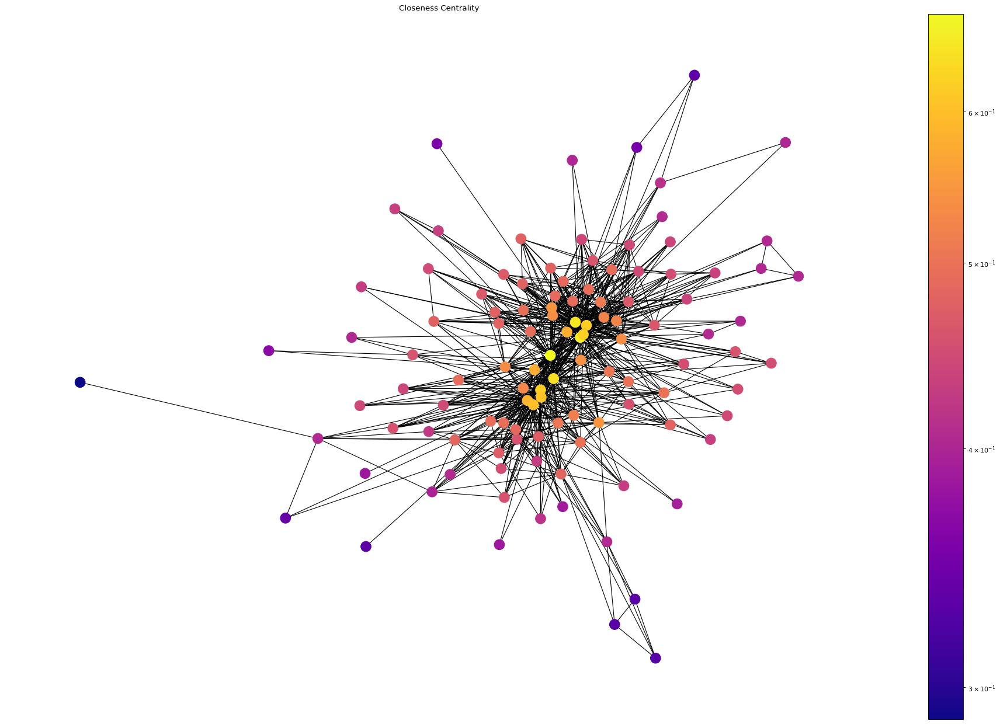

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
close = nx.closeness_centrality(graph_mentions)
draw(graph_mentions, pos, close, 'Closeness Centrality', False)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(array([0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 , 0.65, 0.7 ]),
 <a list of 10 Text major ticklabel objects>)

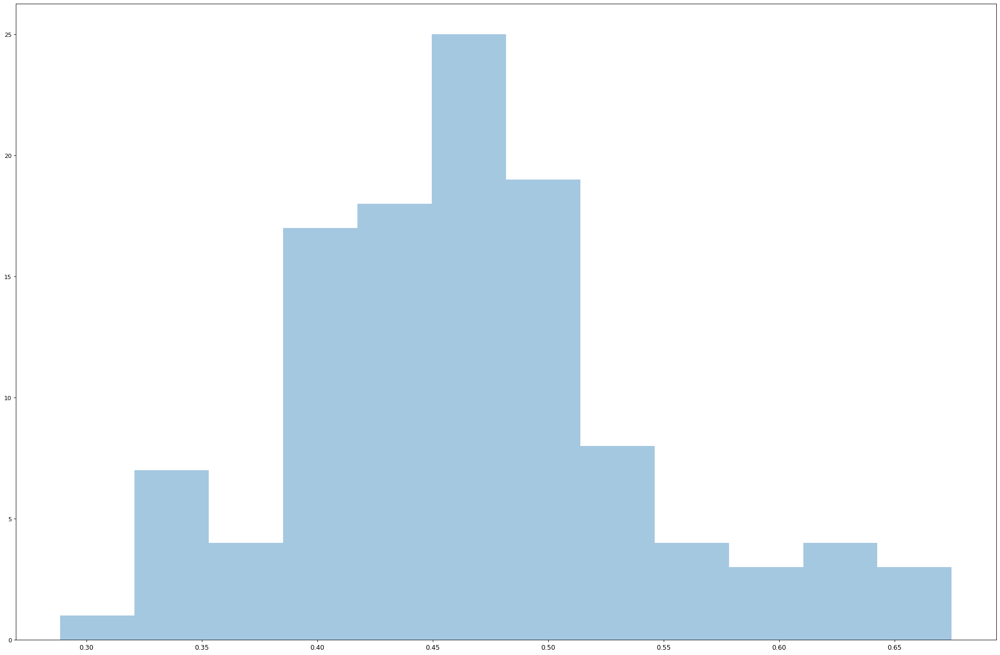

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
sns.distplot(list(close.values()), kde=False)
plt.xticks(fontsize=11)

In [ ]:
close_sorted=sorted(close.items(), key= lambda x: x[1], reverse = True)
for i in range(10):
  print(close_sorted[i])

('R2-D2', 0.6746987951807228)
('OBI-WAN', 0.6588235294117647)
('ANAKIN', 0.6473988439306358)
('C-3PO', 0.64)
('EMPEROR', 0.6222222222222222)
('PADME', 0.6187845303867403)
('LUKE', 0.6187845303867403)
('LEIA', 0.6086956521739131)
('HAN', 0.6021505376344086)
('CHEWBACCA', 0.5863874345549738)


## Analisi delle triadi, delle clique e delle comunità

In [ ]:
triad_class = [[],[],[],[]]
total_triads = 0

for nodes in combinations(graph_mentions.nodes, 3):
  n_edges = graph_mentions.subgraph(nodes).number_of_edges()
  triad_class[n_edges].append(nodes)

for i in range(4):
  total_triads += len(triad_class[i])

print("Le triadi totali del grafo sulle menzioni sono:", total_triads)
print("Di queste le triadi chiuse sono:", len(triad_class[3]))

Le triadi totali del grafo sulle menzioni sono: 234136
Di queste le triadi chiuse sono: 3120


In [ ]:
all_cliques_num = len(list(nx.enumerate_all_cliques(graph_mentions)))
maximum_cliques_num = nx.graph_number_of_cliques(graph_mentions)
max_cliques_dim = nx.graph_clique_number(graph_mentions)

print("Le clique totali del grafo sulle menzioni sono:", all_cliques_num)
print("Di queste le clique massimali sono:", maximum_cliques_num)
print("La clique massima è composta da", max_cliques_dim,"nodi")

maximum_cliques_list = list(nx.find_cliques(graph_mentions))
maximum_cliques_list.sort(key = len)
maximum_cliques_list.reverse()

print("La clique massima è:", maximum_cliques_list[0])

Le clique totali del grafo sulle menzioni sono: 63365
Di queste le clique massimali sono: 148
La clique massima è composta da 13 nodi
La clique massima è: ['R2-D2', 'SIO BIBBLE', 'QUI-GON', 'ANAKIN', 'OBI-WAN', 'JAR JAR', 'PADME', 'MACE WINDU', 'YODA', 'EMPEROR', 'BOSS NASS', 'CAPTAIN PANAKA', 'RABE']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


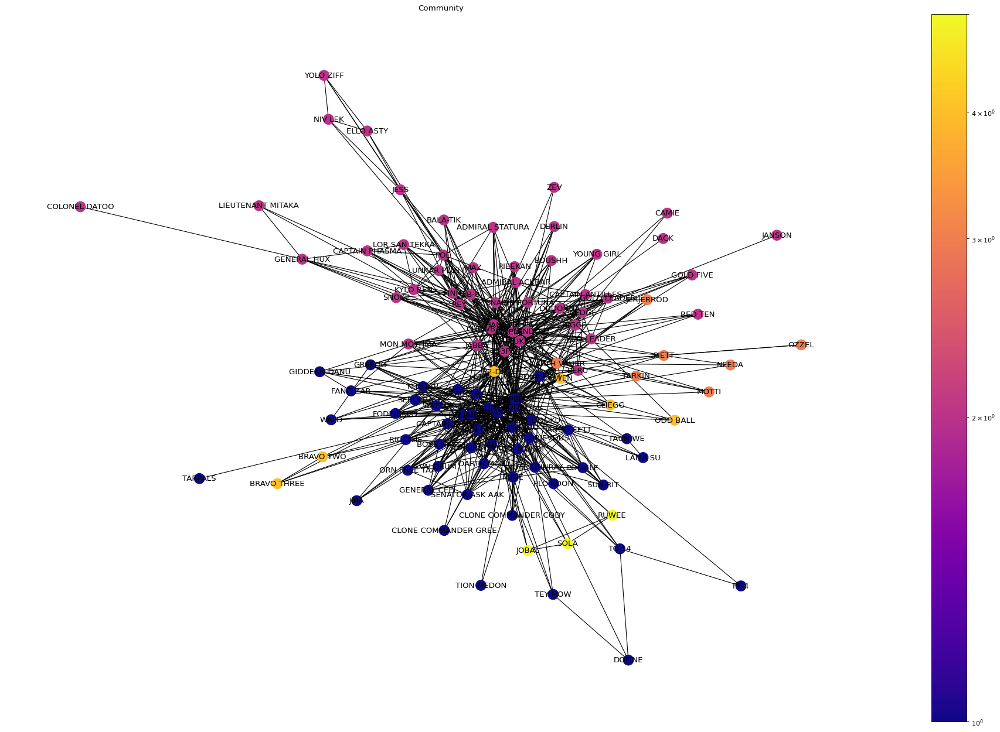

In [ ]:
c=greedy_modularity_communities(graph_mentions)
community={}

i=1
for frozenset in c:
  fs=frozenset
  for x in fs:
    community[x]=i
  i=i+1

pos = nx.spring_layout(graph_mentions)
plt.figure(num=None, figsize=(30, 20), dpi=80)
draw(graph_mentions, pos, community, 'Community', True)

In [ ]:
i=0
colors=["Blu", "Viola", "Arancione", "Ocra", "Giallo"]
for frozenset in c:
  count=0
  for elem in frozenset:
    count=count+1
  print("Il numero di nodi della community "+colors[i]+" è:"+str(count))
  i=i+1
  

Il numero di nodi della community Blu è:50
Il numero di nodi della community Viola è:47
Il numero di nodi della community Arancione è:7
Il numero di nodi della community Ocra è:6
Il numero di nodi della community Giallo è:3



# **Analisi SottoGrafo**

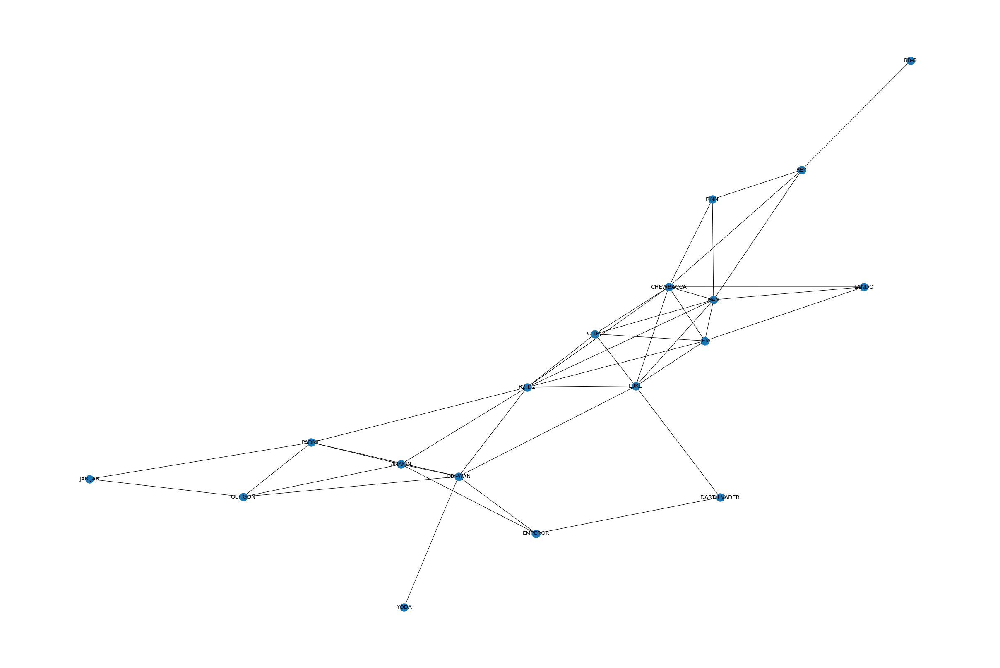

In [ ]:
sub_graph_mentions= nx.Graph()

get_subgraph(graph_mentions, sub_graph_mentions, 30)
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(sub_graph_mentions, with_labels=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


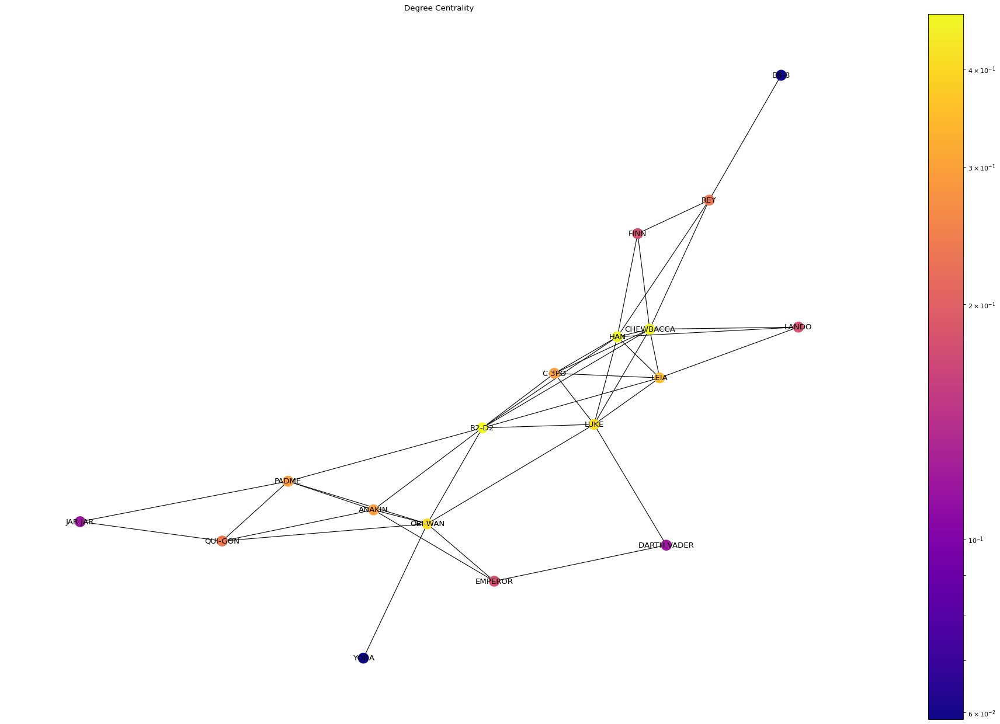

In [ ]:
sub_pos = nx.spring_layout(sub_graph_mentions)
plt.figure(num=None, figsize=(30, 20), dpi=80)
sub_degree = nx.degree_centrality(sub_graph_mentions)
draw(sub_graph_mentions, sub_pos, sub_degree, 'Degree Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5]),
 <a list of 6 Text major ticklabel objects>)

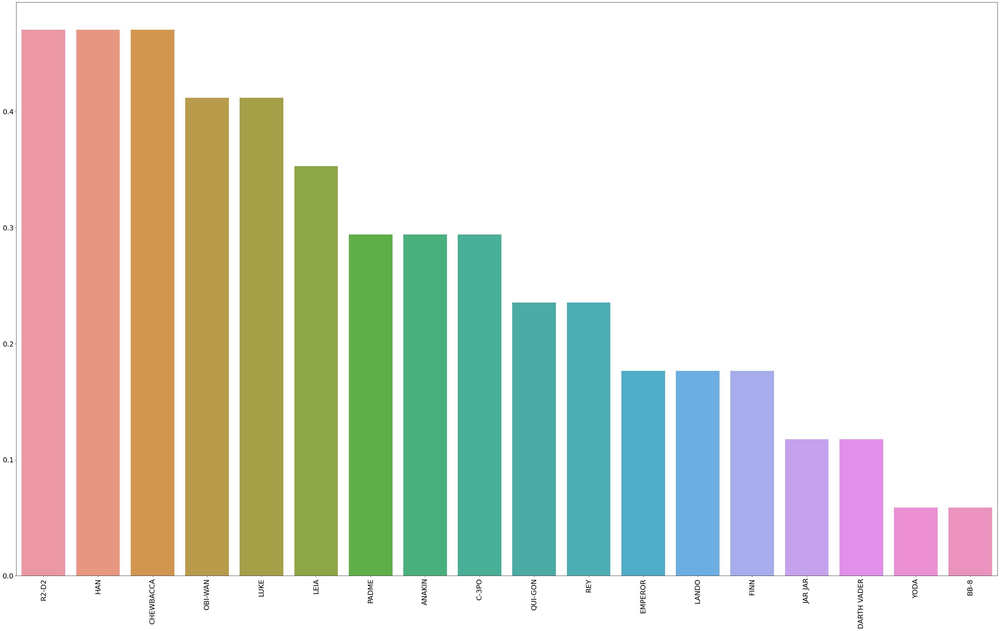

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_sub_degree = dict(sorted(sub_degree.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_sub_degree.keys()), list(sort_sub_degree.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


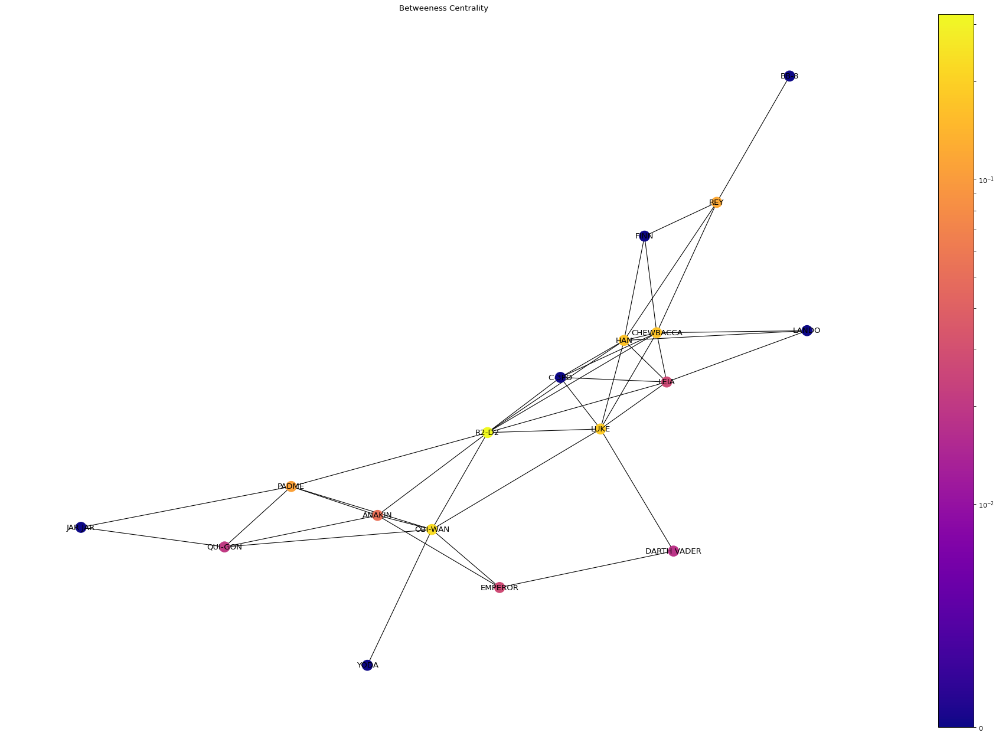

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
sub_bet = nx.betweenness_centrality(sub_graph_mentions)
draw(sub_graph_mentions, sub_pos, sub_bet, 'Betweeness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35]),
 <a list of 8 Text major ticklabel objects>)

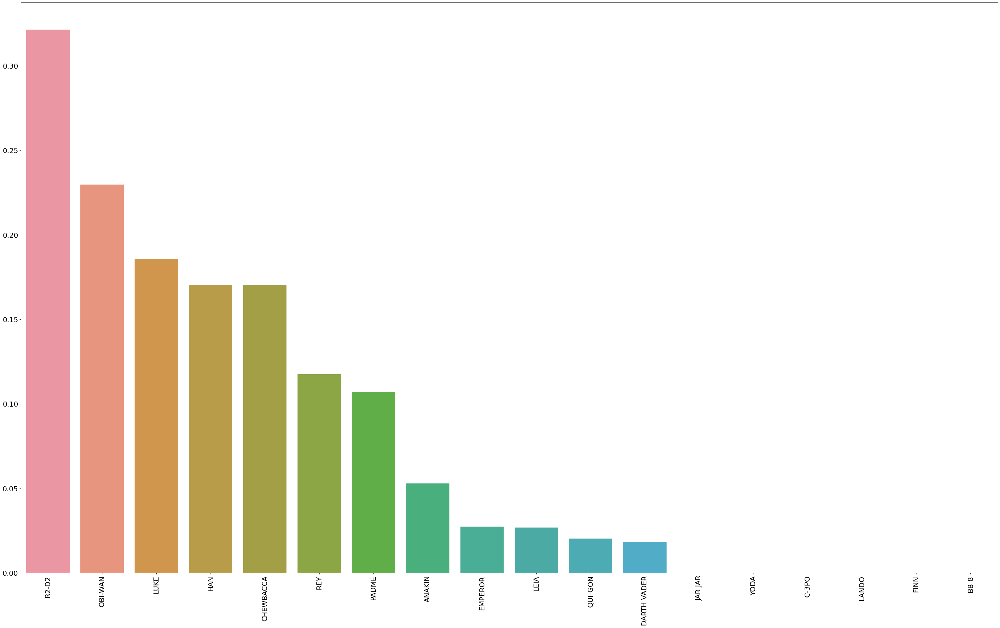

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_sub_bet = dict(sorted(sub_bet.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_sub_bet.keys()), list(sort_sub_bet.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


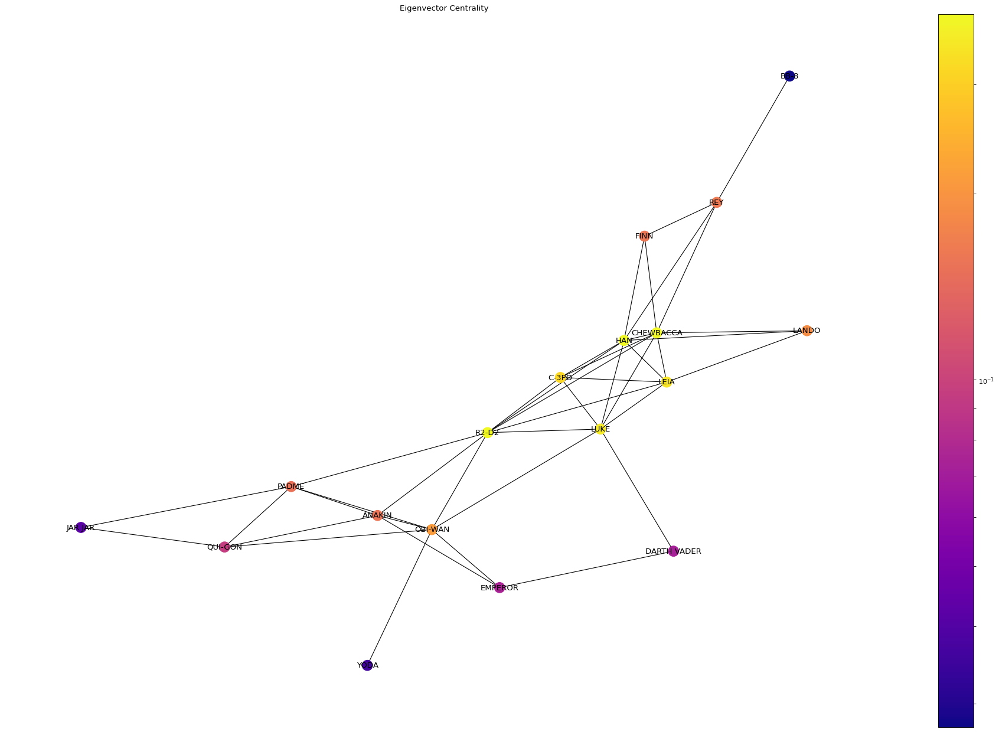

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
sub_eigen = nx.eigenvector_centrality(sub_graph_mentions)
draw(sub_graph_mentions, sub_pos, sub_eigen, 'Eigenvector Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45]),
 <a list of 10 Text major ticklabel objects>)

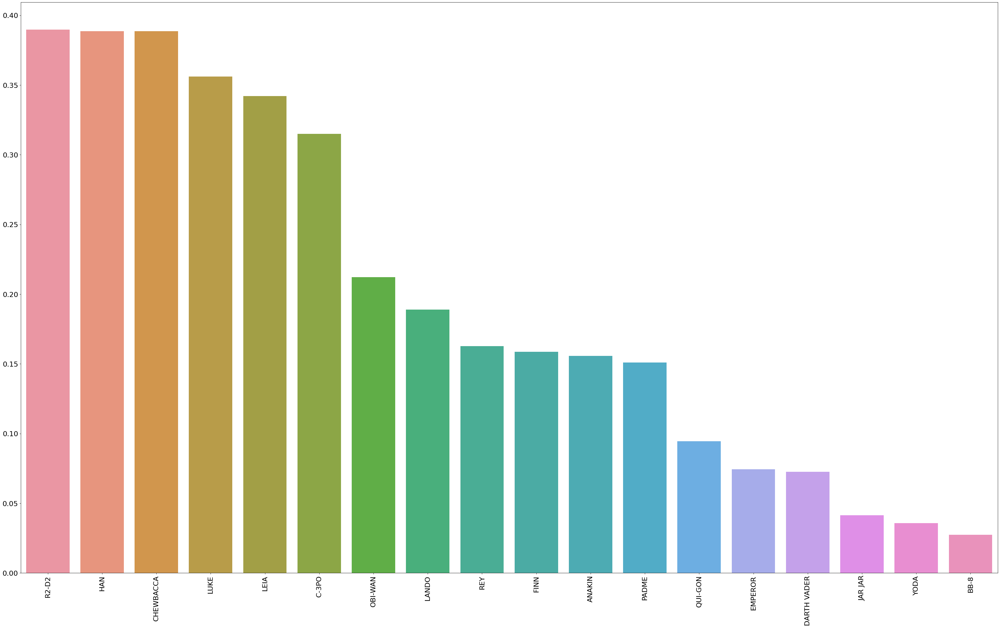

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_sub_eigen = dict(sorted(sub_eigen.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_sub_eigen.keys()), list(sort_sub_eigen.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


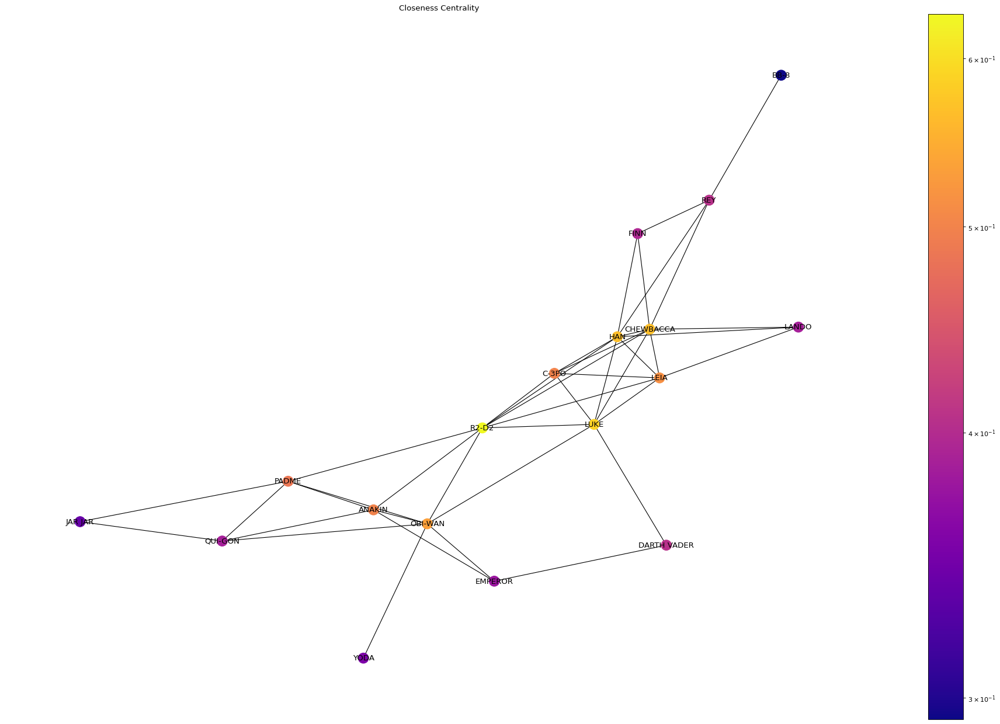

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
sub_close = nx.closeness_centrality(sub_graph_mentions)
draw(sub_graph_mentions, sub_pos, sub_close, 'Closeness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]),
 <a list of 8 Text major ticklabel objects>)

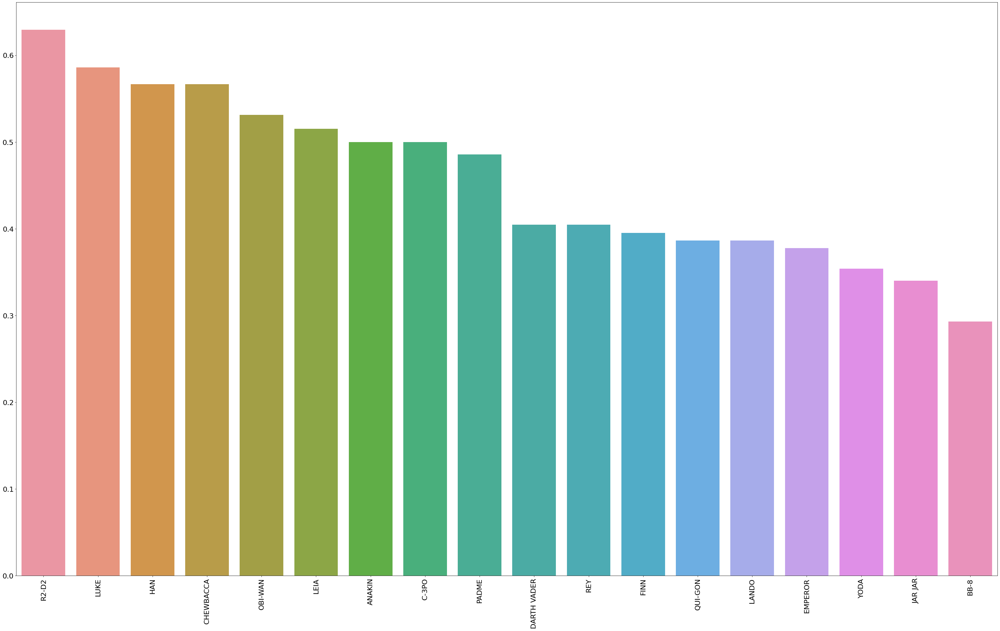

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_sub_close = dict(sorted(sub_close.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_sub_close.keys()), list(sort_sub_close.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)


# **Analisi dei Film della Trilogia Prequel**

## Episodio 1

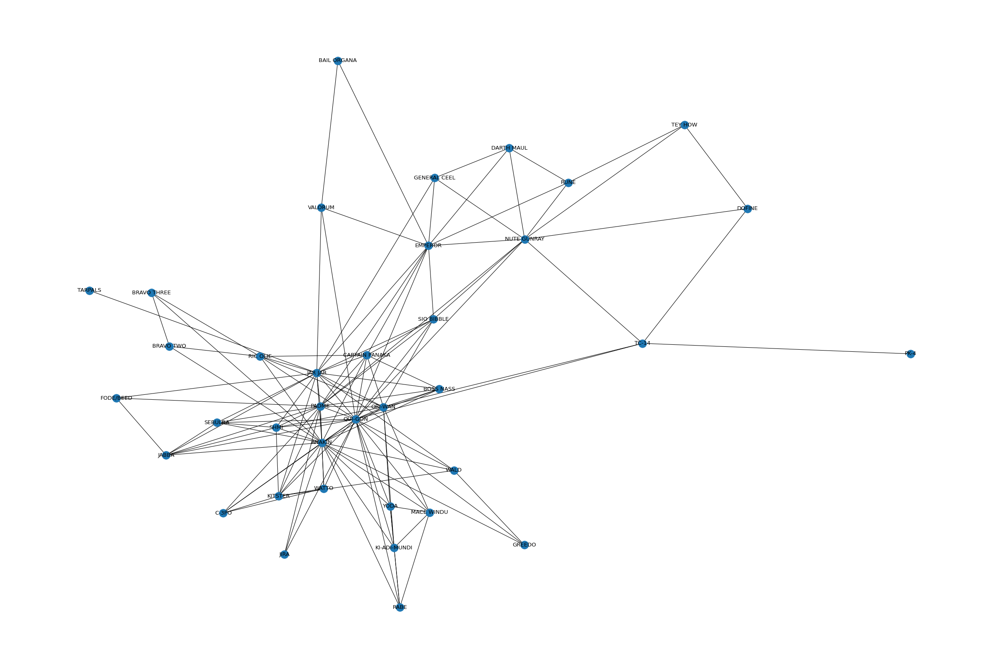

In [ ]:
graph_interactions_ep1 = nx.Graph()
extract_nodes_and_edges(graph_interactions_ep1, dataset_interactions_ep1)
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(graph_interactions_ep1, with_labels=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


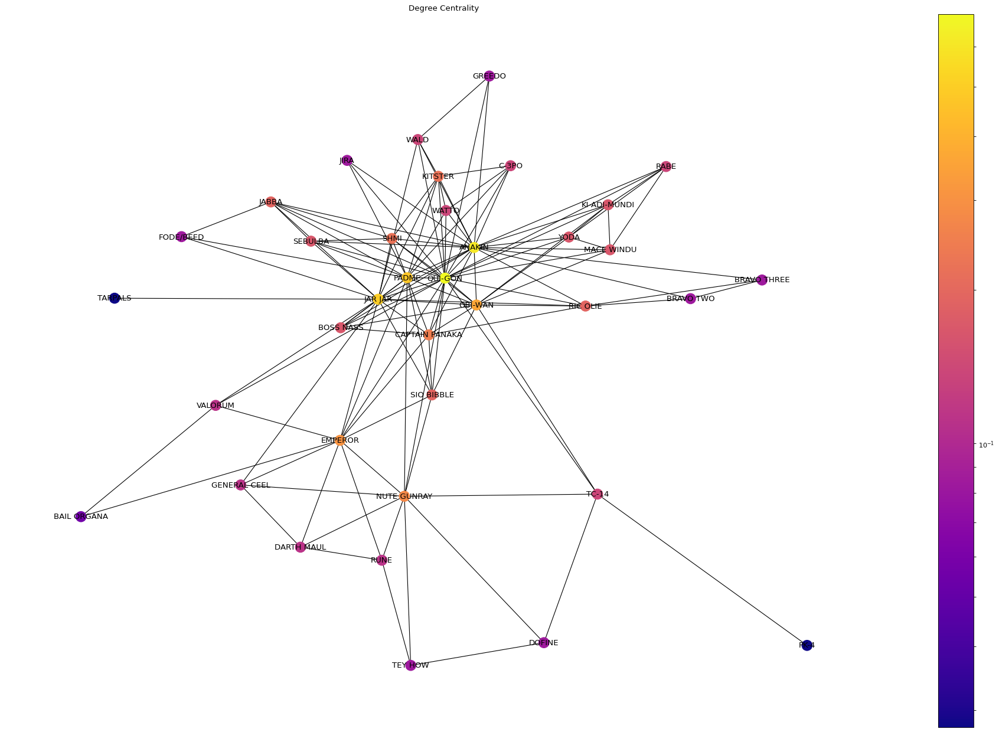

In [ ]:
pos_ep1 = nx.spring_layout(graph_interactions_ep1)
plt.figure(num=None, figsize=(30, 20), dpi=80)
degree_ep1 = nx.degree_centrality(graph_interactions_ep1)
draw(graph_interactions_ep1, pos_ep1, degree_ep1, 'Degree Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
 <a list of 9 Text major ticklabel objects>)

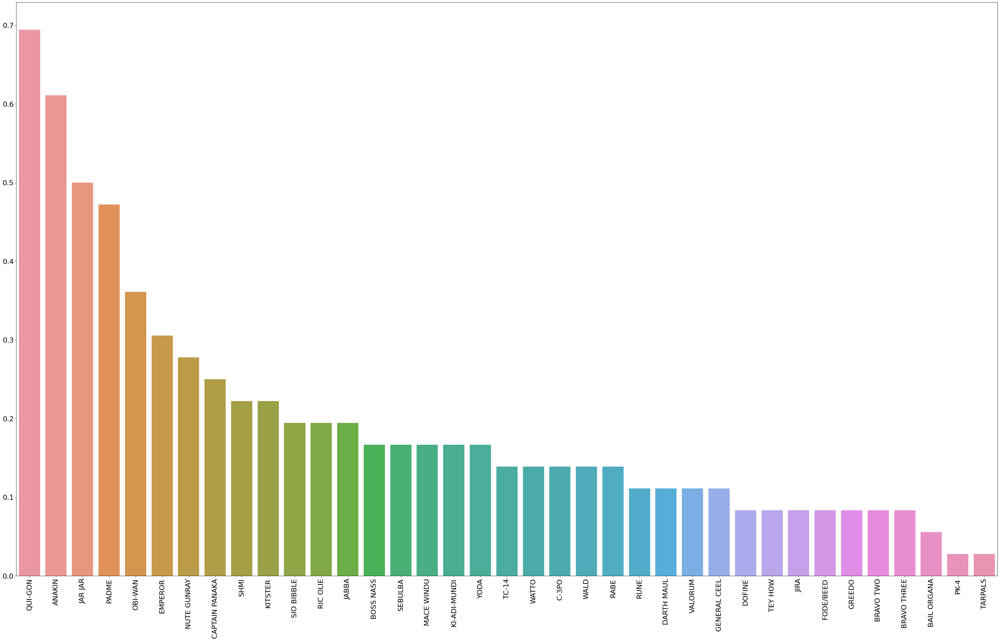

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_degree_ep1 = dict(sorted(degree_ep1.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_degree_ep1.keys()), list(sort_degree_ep1.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


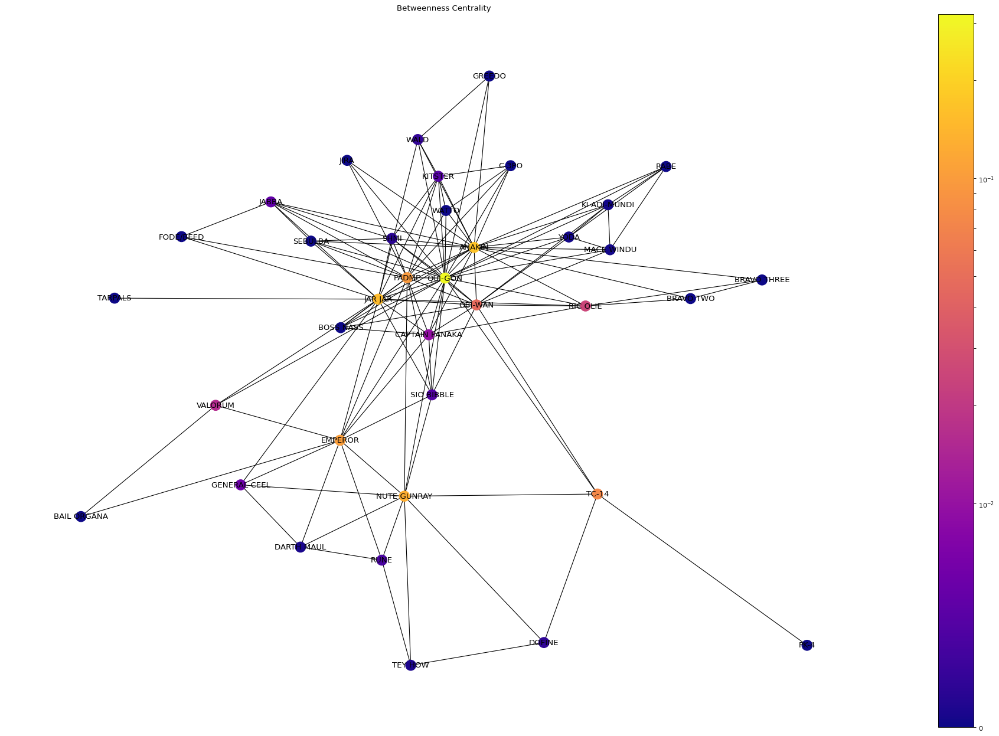

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
bet_ep1 = nx.betweenness_centrality(graph_interactions_ep1)
draw(graph_interactions_ep1, pos_ep1, bet_ep1, 'Betweenness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35]),
 <a list of 8 Text major ticklabel objects>)

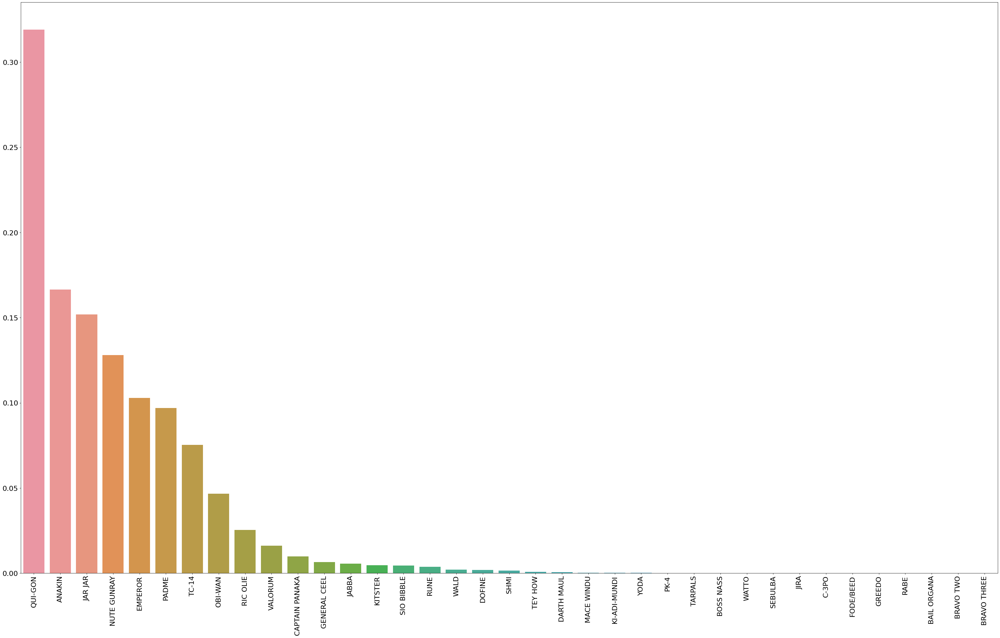

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_bet_ep1 = dict(sorted(bet_ep1.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_bet_ep1.keys()), list(sort_bet_ep1.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


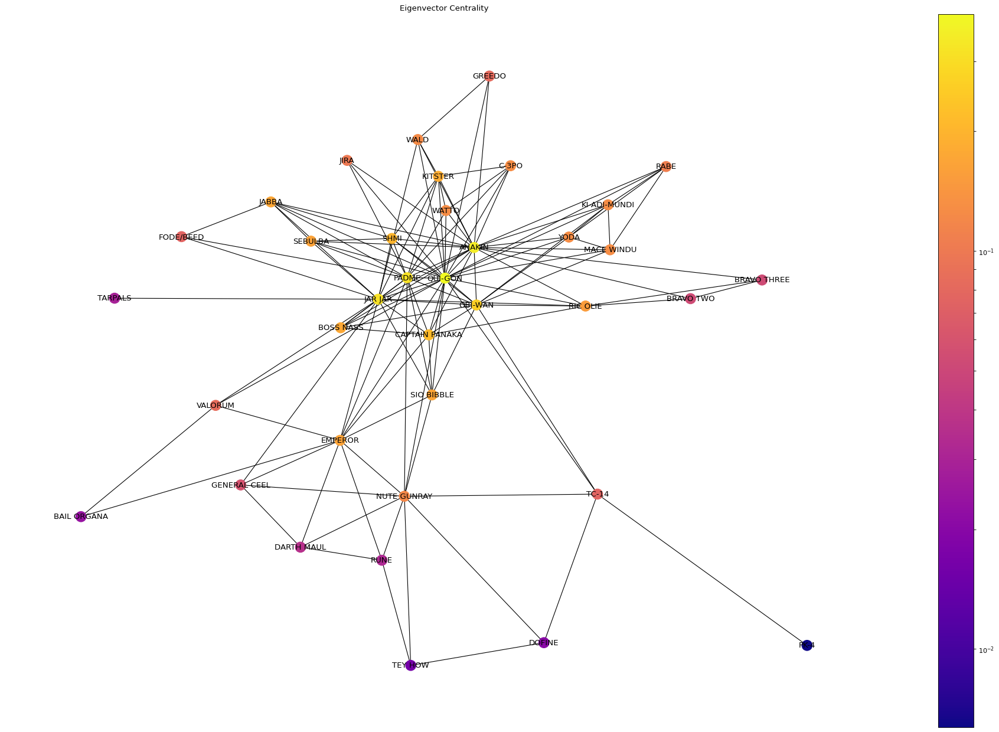

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
eig_ep1 = nx.eigenvector_centrality(graph_interactions_ep1)
draw(graph_interactions_ep1, pos_ep1, eig_ep1, 'Eigenvector Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45]),
 <a list of 10 Text major ticklabel objects>)

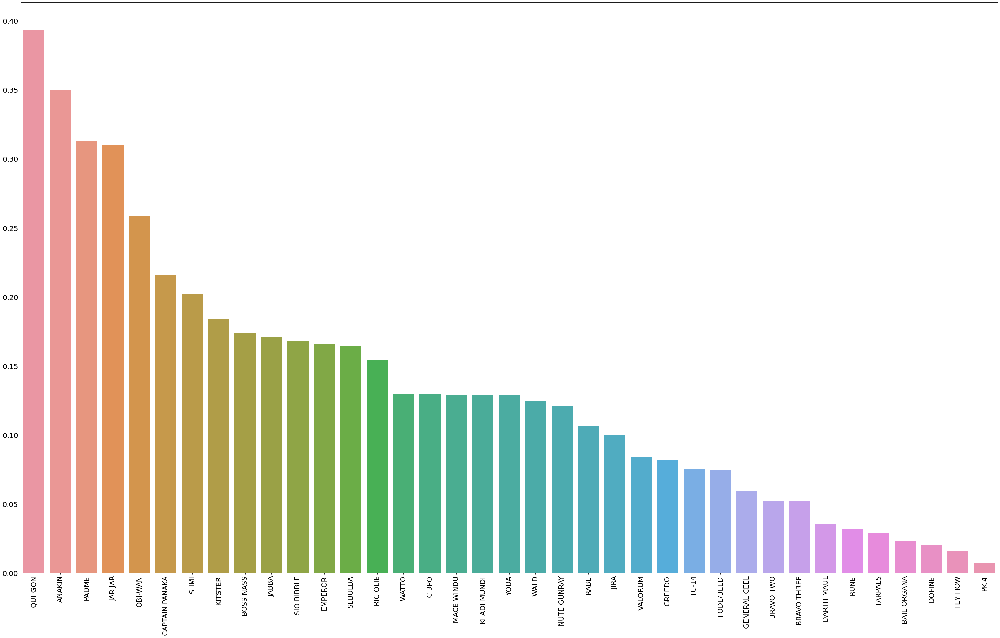

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_eig_ep1 = dict(sorted(eig_ep1.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_eig_ep1.keys()), list(sort_eig_ep1.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


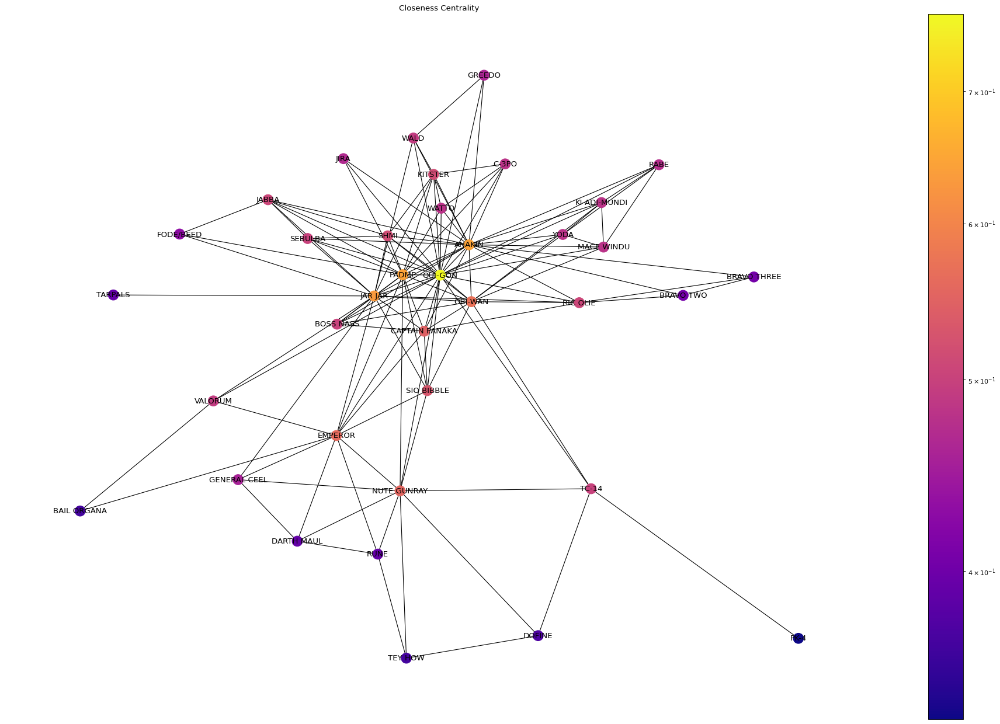

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
close_ep1 = nx.closeness_centrality(graph_interactions_ep1)
draw(graph_interactions_ep1, pos_ep1, close_ep1, 'Closeness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 <a list of 10 Text major ticklabel objects>)

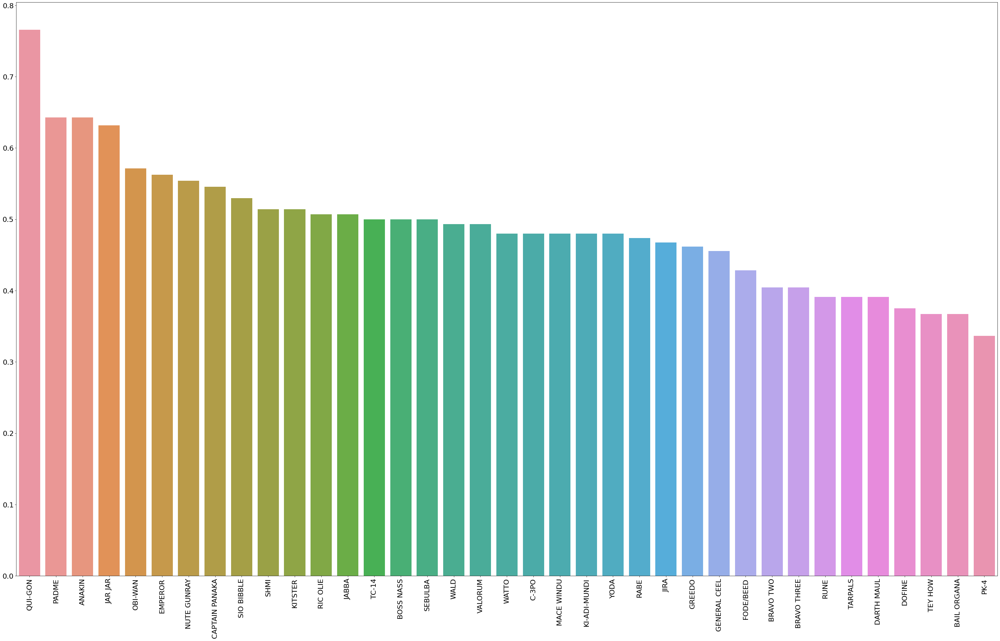

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_close_ep1 = dict(sorted(close_ep1.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_close_ep1.keys()), list(sort_close_ep1.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

## Episodio 2

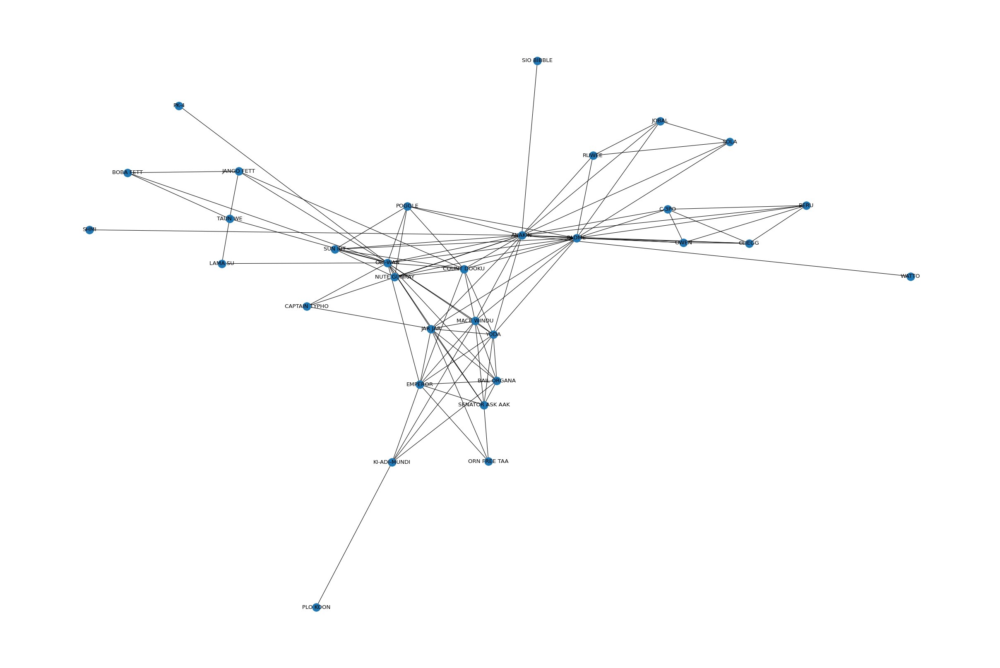

In [ ]:
graph_interactions_ep2 = nx.Graph()
extract_nodes_and_edges(graph_interactions_ep2, dataset_interactions_ep2)
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(graph_interactions_ep2, with_labels=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


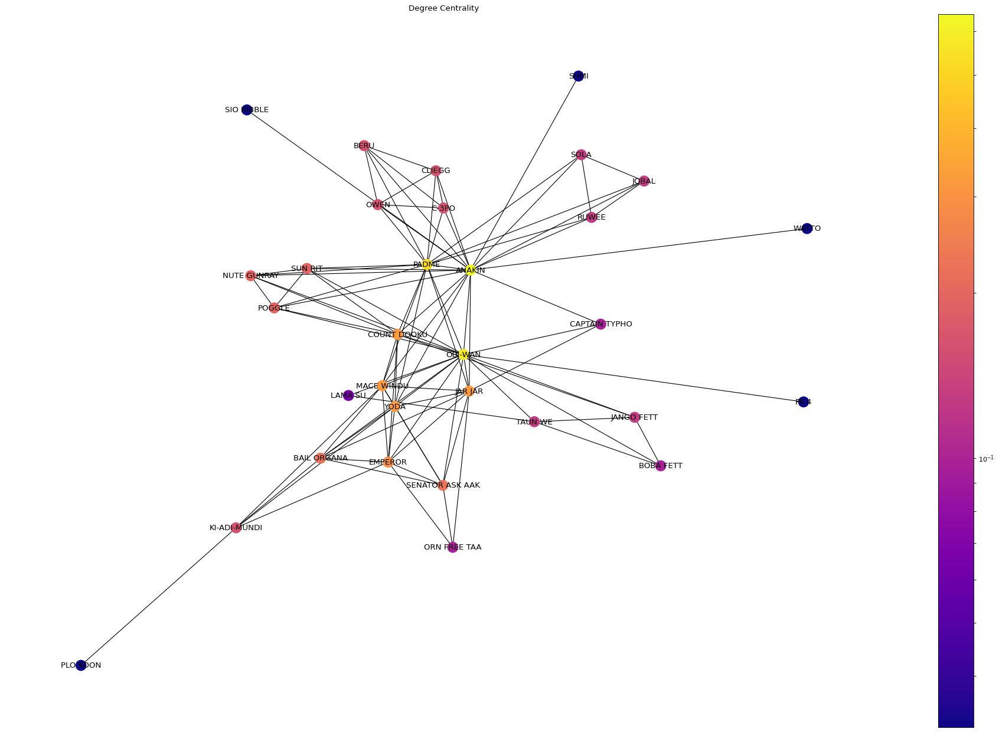

In [ ]:
pos_ep2 = nx.spring_layout(graph_interactions_ep2)
plt.figure(num=None, figsize=(30, 20), dpi=80)
degree_ep2 = nx.degree_centrality(graph_interactions_ep2)
draw(graph_interactions_ep2, pos_ep2, degree_ep2, 'Degree Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
 <a list of 9 Text major ticklabel objects>)

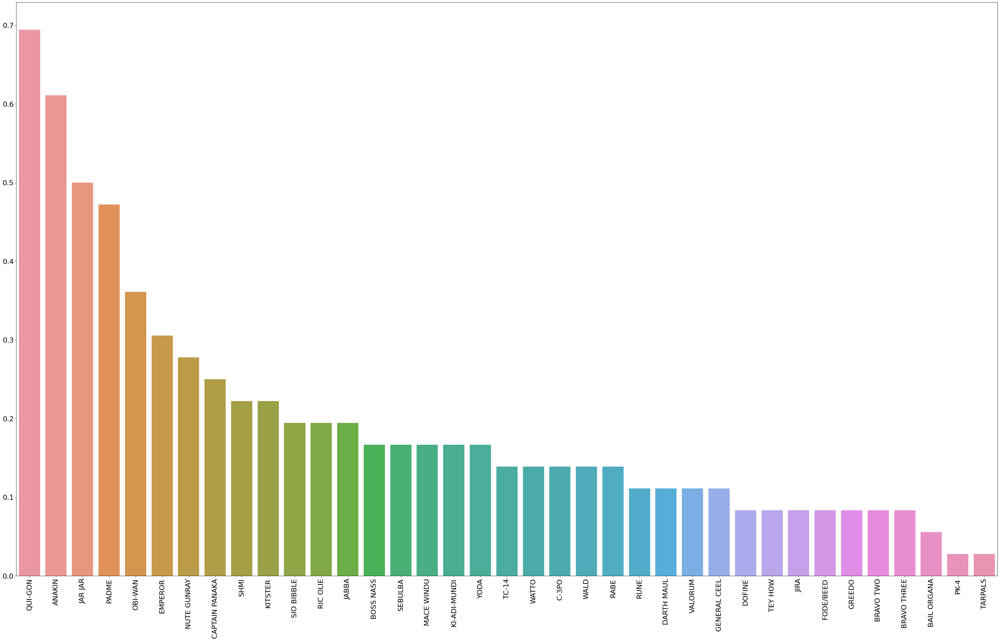

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_degree_ep2 = dict(sorted(degree_ep1.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_degree_ep2.keys()), list(sort_degree_ep2.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


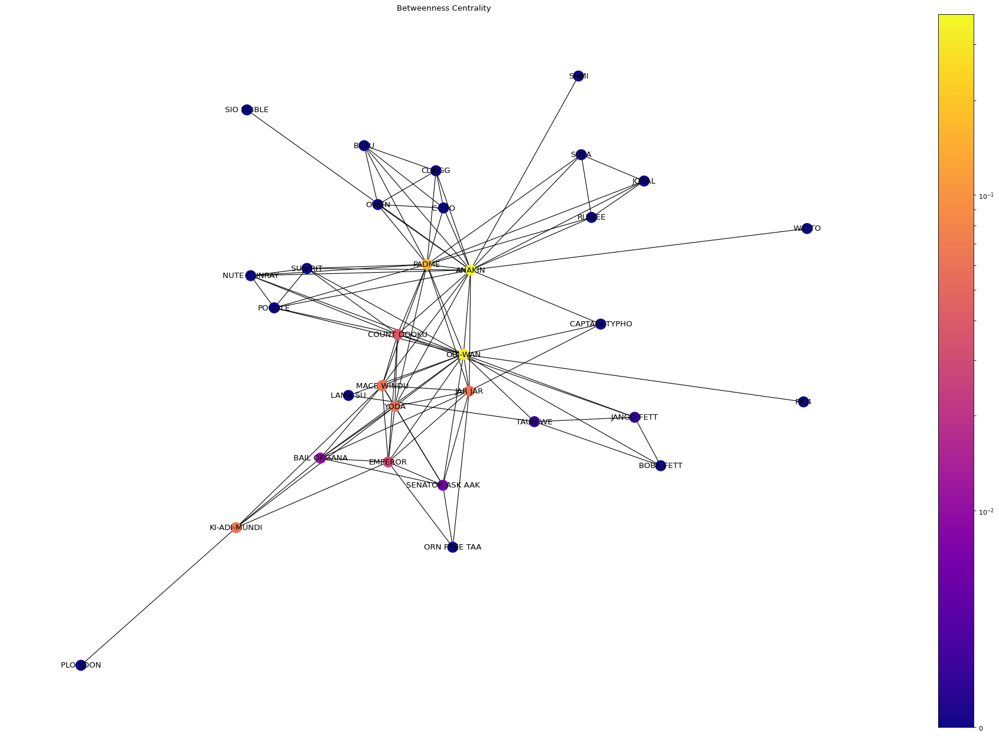

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
bet_ep2 = nx.betweenness_centrality(graph_interactions_ep2)
draw(graph_interactions_ep2, pos_ep2, bet_ep2, 'Betweenness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 ]),
 <a list of 9 Text major ticklabel objects>)

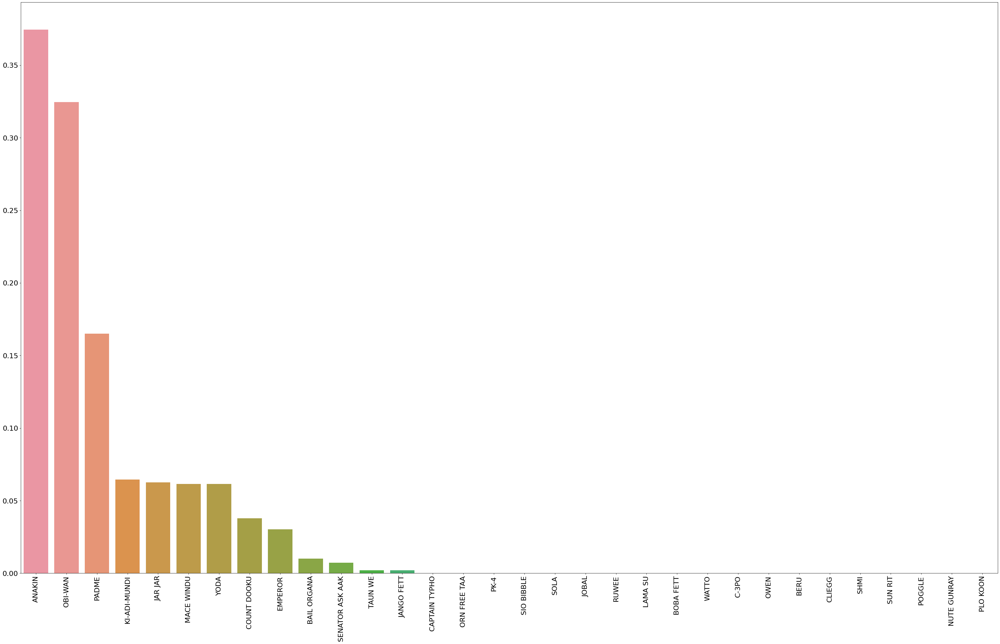

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_bet_ep2 = dict(sorted(bet_ep2.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_bet_ep2.keys()), list(sort_bet_ep2.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


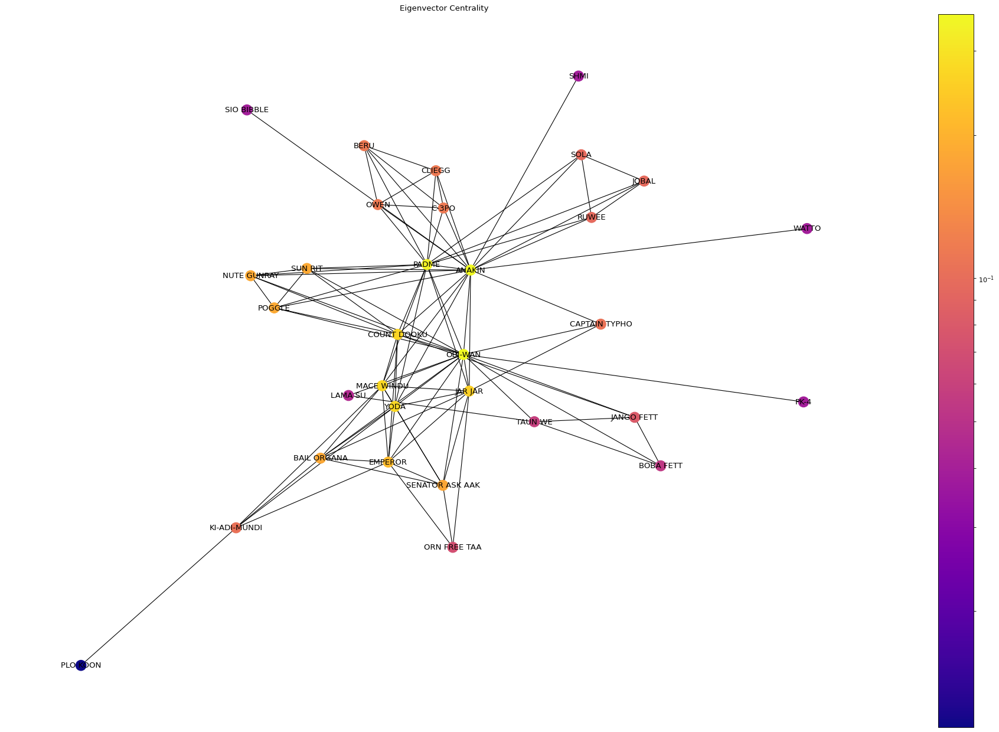

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
eig_ep2 = nx.eigenvector_centrality(graph_interactions_ep2)
draw(graph_interactions_ep2, pos_ep2, eig_ep2, 'Eigenvector Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 ]),
 <a list of 9 Text major ticklabel objects>)

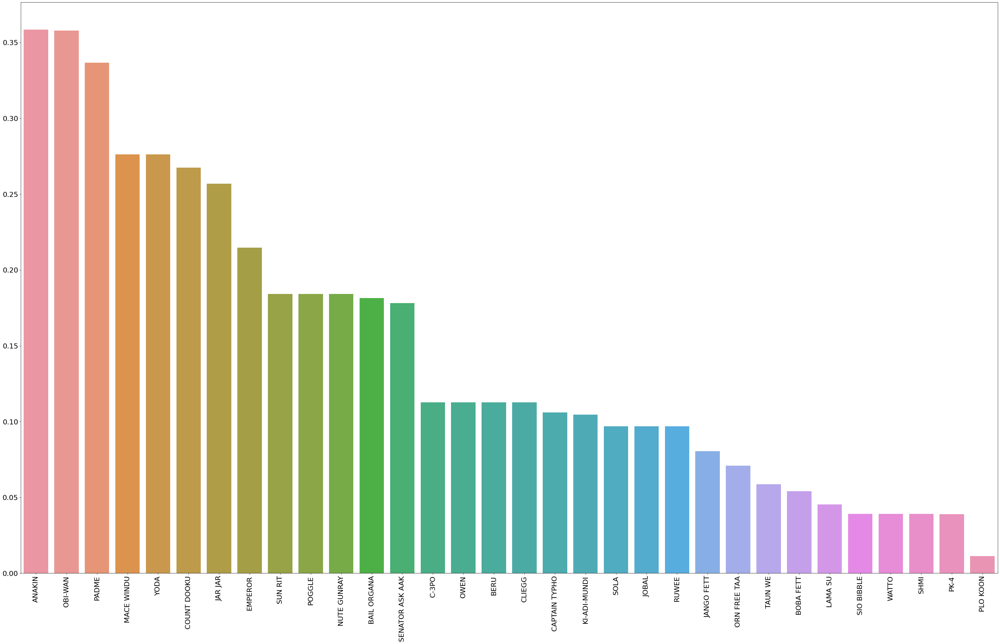

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_eig_ep2 = dict(sorted(eig_ep2.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_eig_ep2.keys()), list(sort_eig_ep2.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


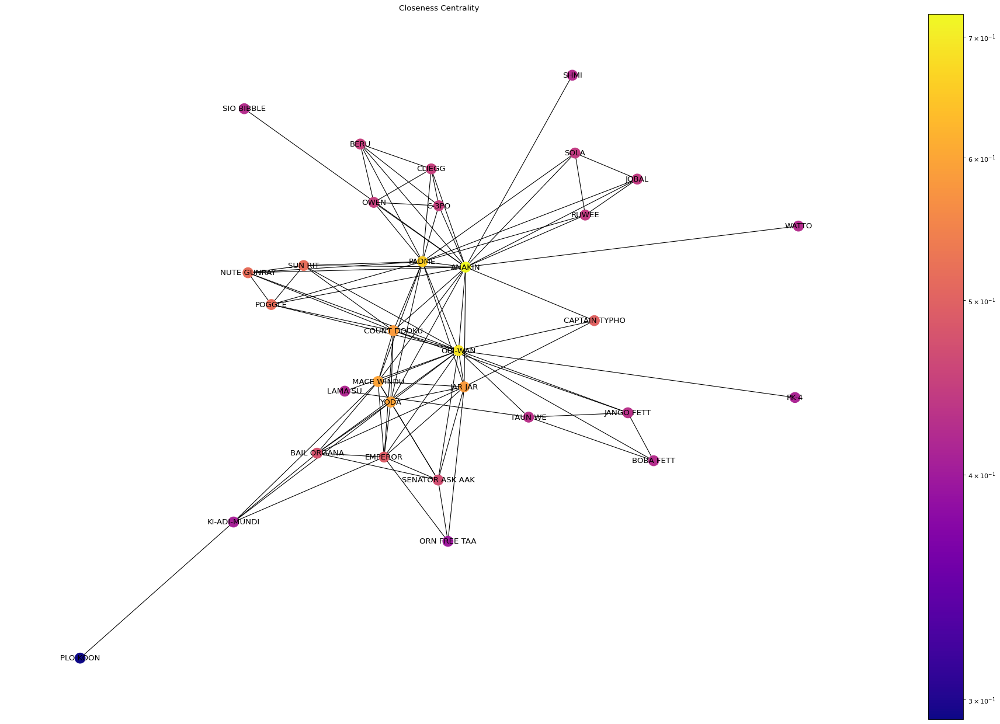

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
close_ep2 = nx.closeness_centrality(graph_interactions_ep2)
draw(graph_interactions_ep2, pos_ep2, close_ep2, 'Closeness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
 <a list of 9 Text major ticklabel objects>)

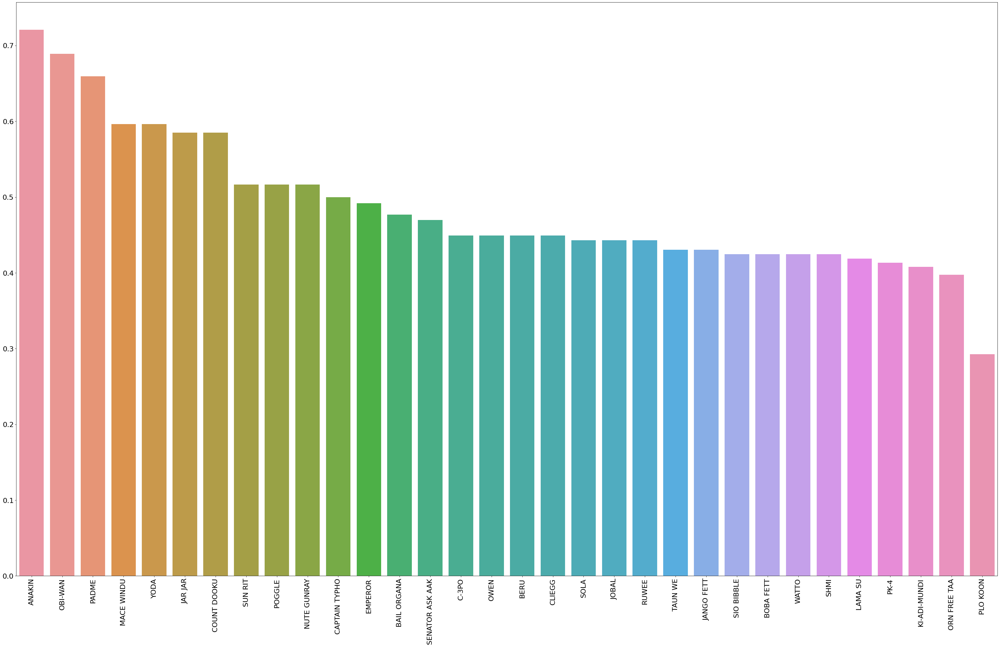

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_close_ep2 = dict(sorted(close_ep2.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_close_ep2.keys()), list(sort_close_ep2.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

## Episodio 3

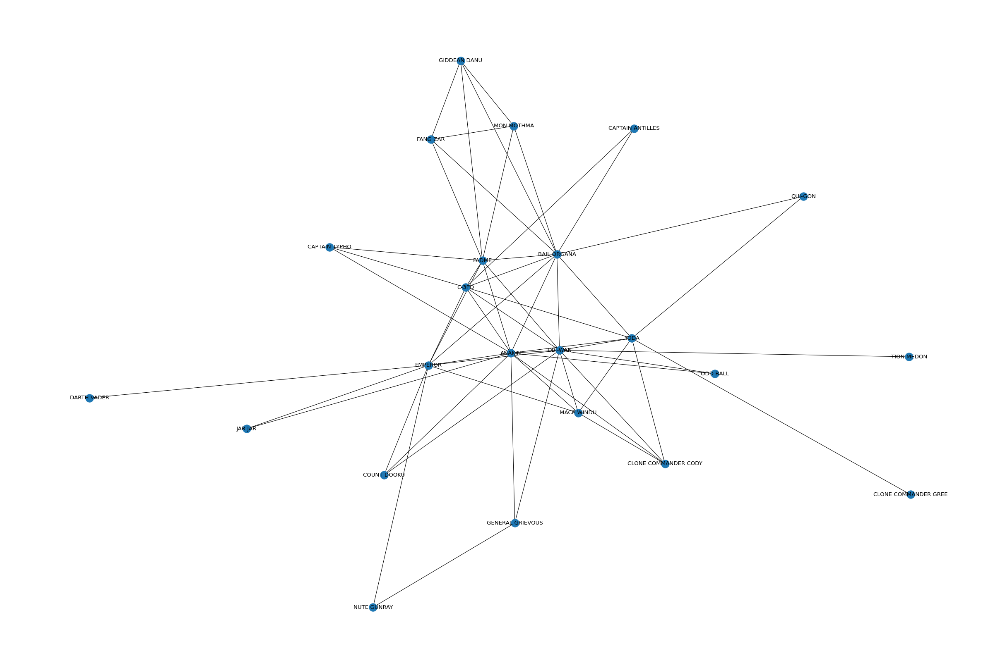

In [ ]:
graph_interactions_ep3 = nx.Graph()
extract_nodes_and_edges(graph_interactions_ep3, dataset_interactions_ep3)
plt.figure(num=None, figsize=(30, 20), dpi=80)
graph_interactions_ep3.remove_node("PLO KOON")
nx.draw(graph_interactions_ep3, with_labels=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


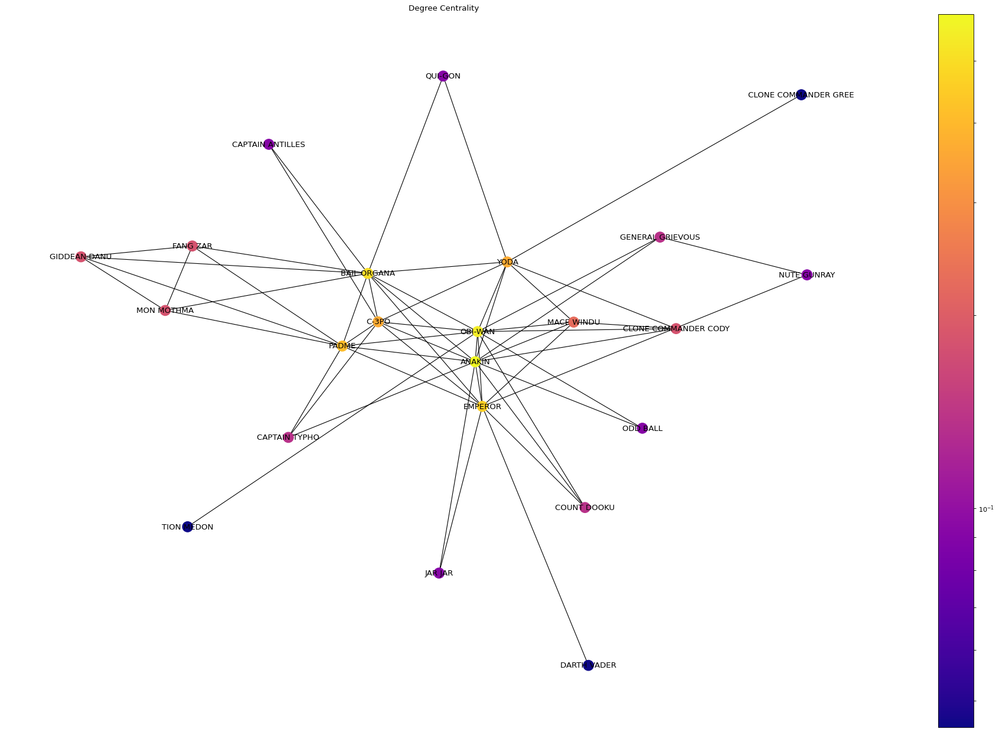

In [ ]:
pos_ep3 = nx.spring_layout(graph_interactions_ep3)
plt.figure(num=None, figsize=(30, 20), dpi=80)
degree_ep3 = nx.degree_centrality(graph_interactions_ep3)
draw(graph_interactions_ep3, pos_ep3, degree_ep3, 'Degree Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]),
 <a list of 8 Text major ticklabel objects>)

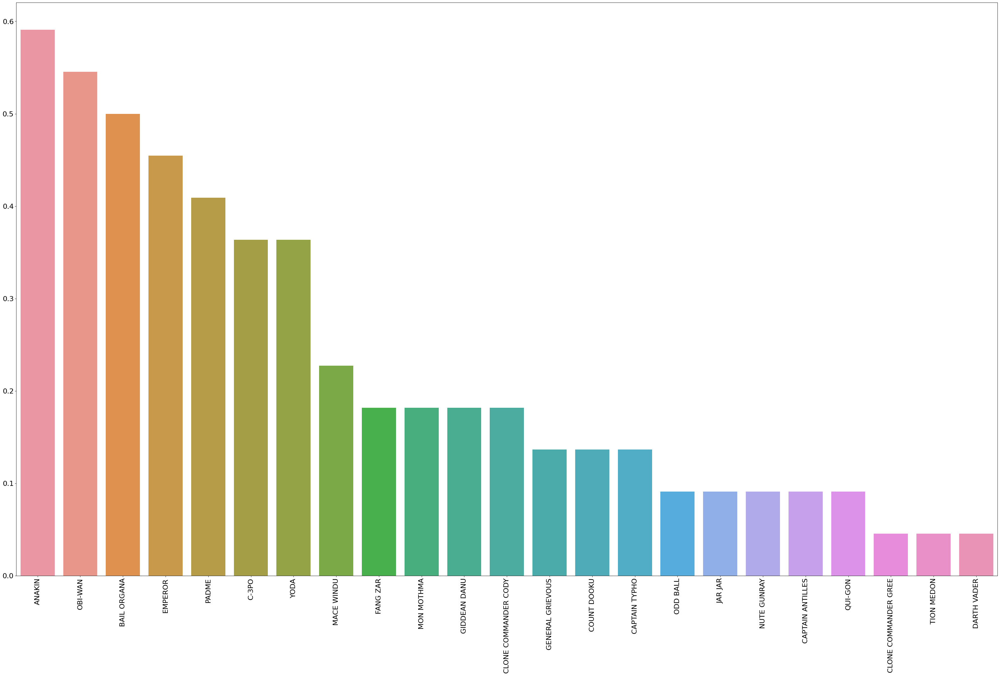

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_degree_ep3 = dict(sorted(degree_ep3.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_degree_ep3.keys()), list(sort_degree_ep3.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


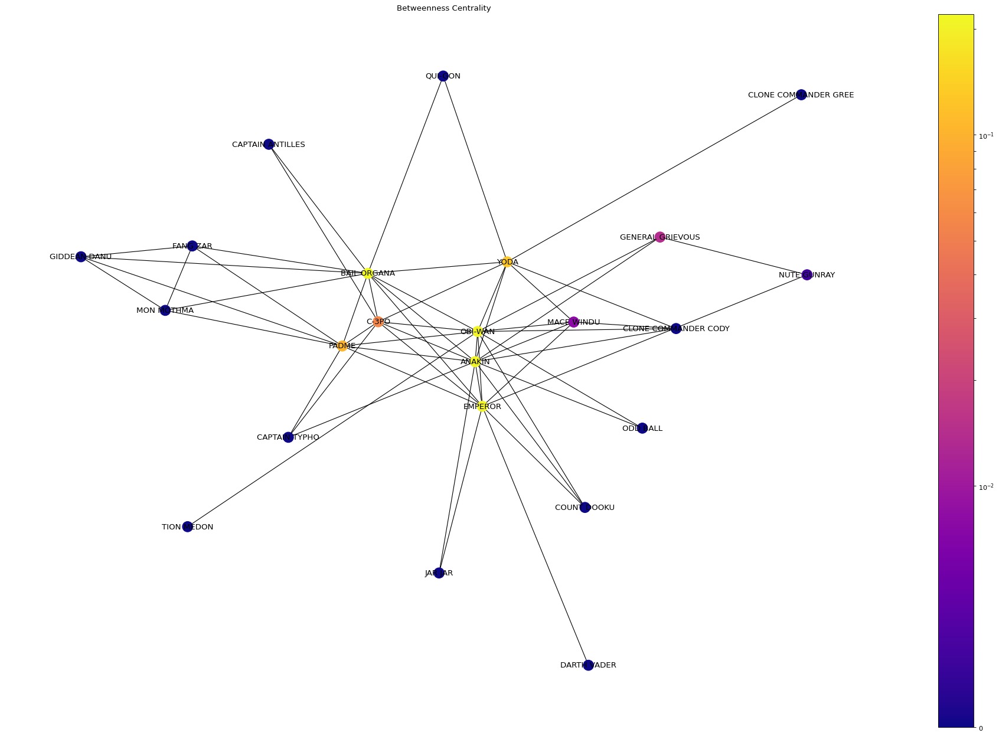

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
bet_ep3 = nx.betweenness_centrality(graph_interactions_ep3)
draw(graph_interactions_ep3, pos_ep3, bet_ep3, 'Betweenness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25]),
 <a list of 6 Text major ticklabel objects>)

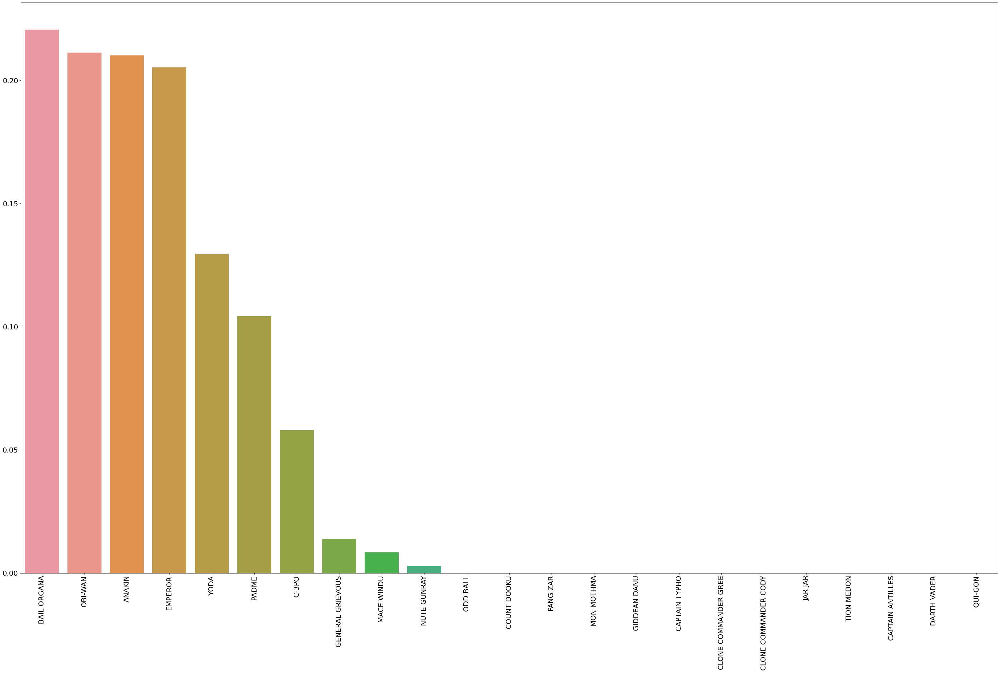

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_bet_ep3 = dict(sorted(bet_ep3.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_bet_ep3.keys()), list(sort_bet_ep3.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


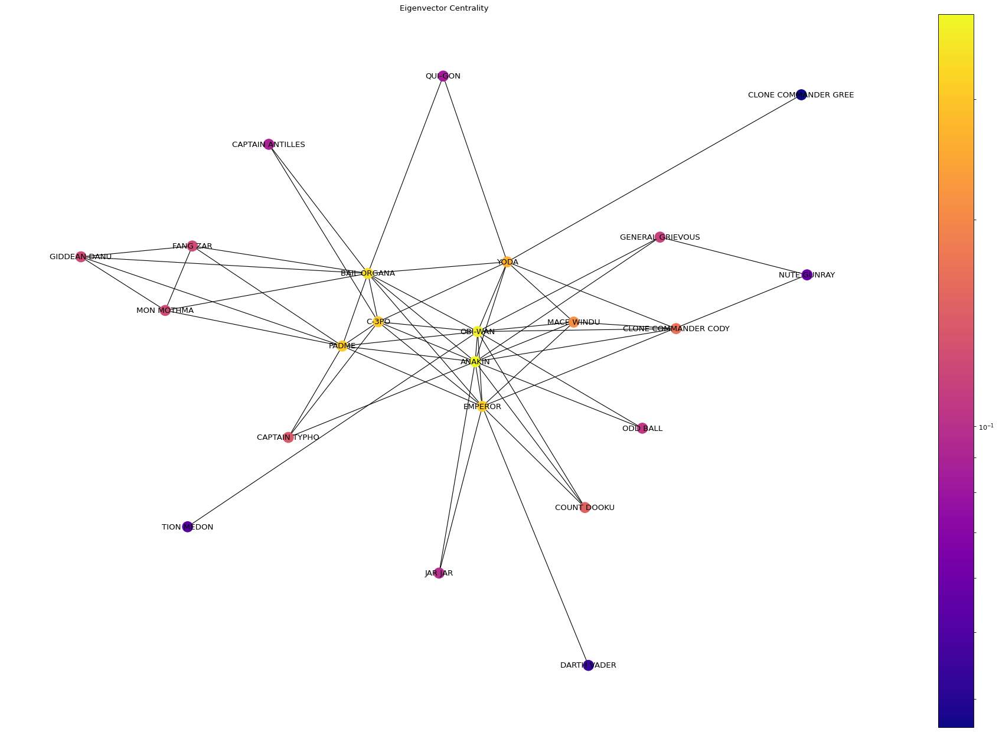

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
eig_ep3 = nx.eigenvector_centrality(graph_interactions_ep3)
draw(graph_interactions_ep3, pos_ep3, eig_ep3, 'Eigenvector Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45]),
 <a list of 10 Text major ticklabel objects>)

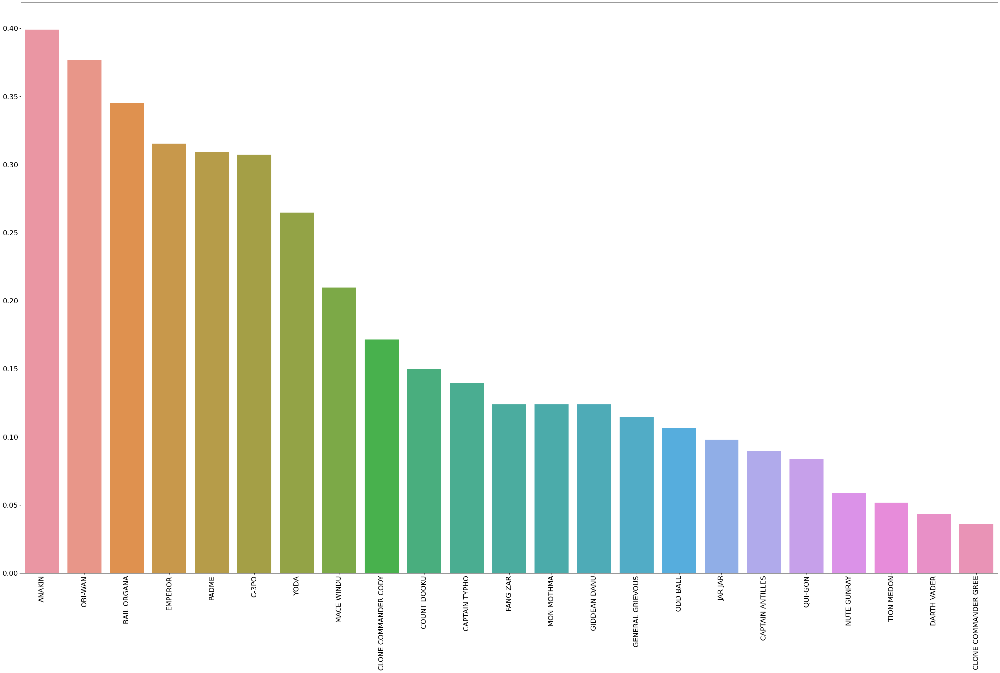

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_eig_ep3 = dict(sorted(eig_ep3.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_eig_ep3.keys()), list(sort_eig_ep3.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


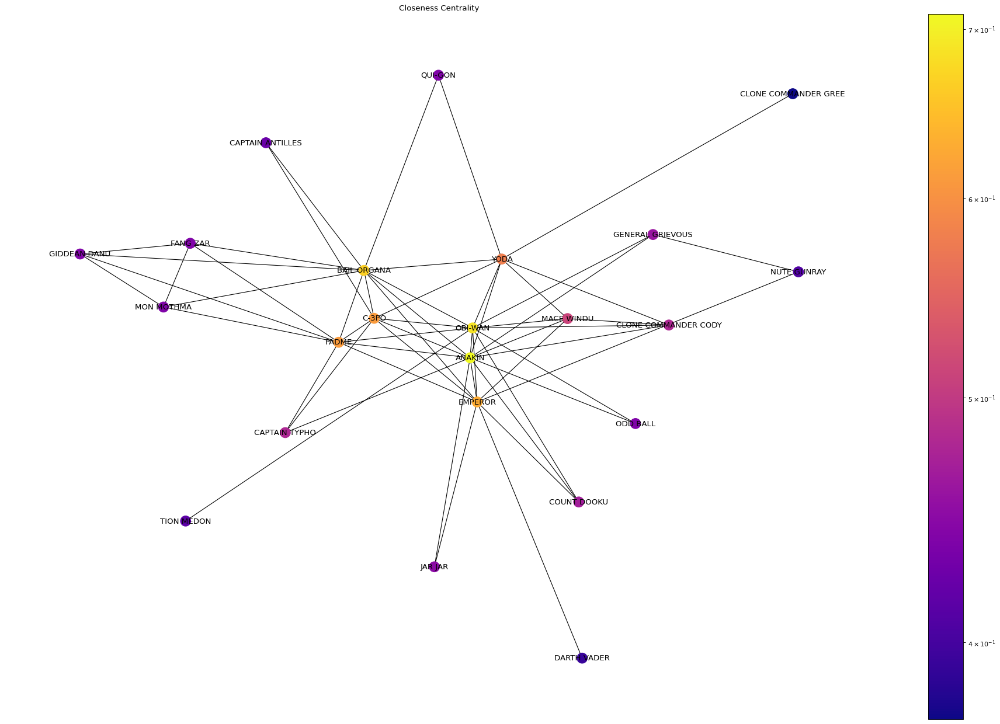

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
close_ep3 = nx.closeness_centrality(graph_interactions_ep3)
draw(graph_interactions_ep3, pos_ep3, close_ep3, 'Closeness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
 <a list of 9 Text major ticklabel objects>)

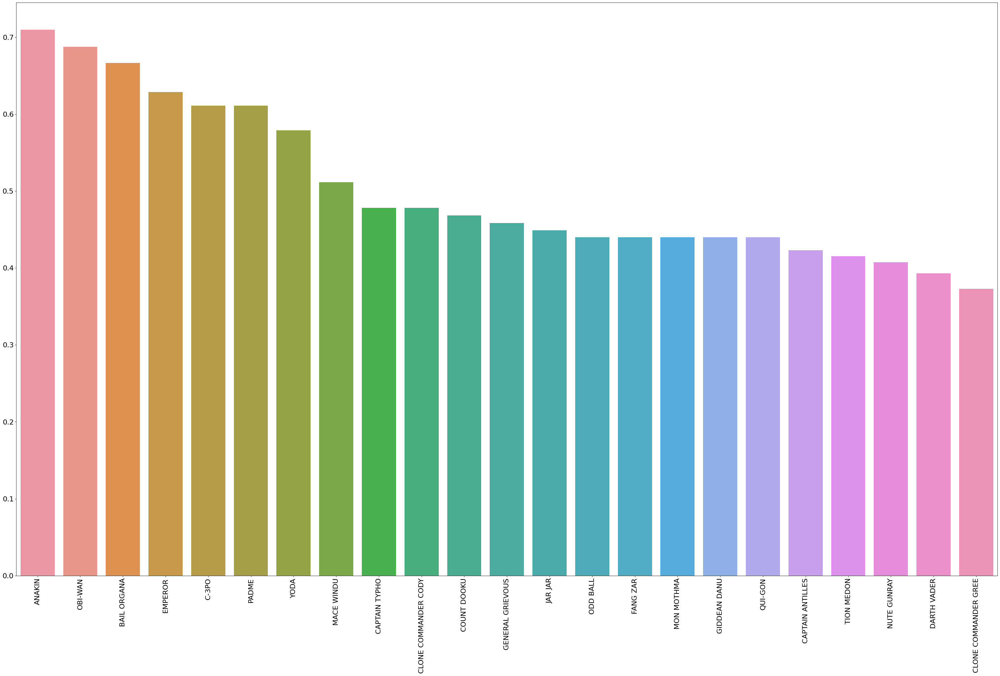

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_close_ep3 = dict(sorted(close_ep3.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_close_ep3.keys()), list(sort_close_ep3.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

## Grafo Trilogia Prequel

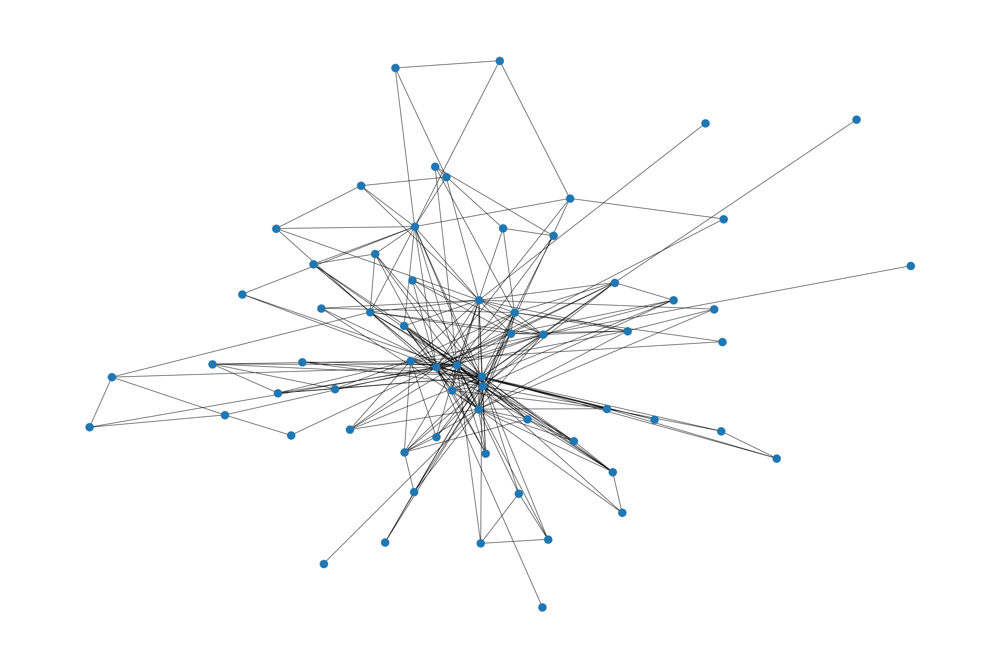

In [ ]:
graph_mid_prequel=nx.compose(graph_interactions_ep1,graph_interactions_ep2)
graph_prequel=nx.compose(graph_mid_prequel,graph_interactions_ep3)
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(graph_prequel, with_labels=False)

In [ ]:
print("Numero di nodi:"+str(graph_prequel.number_of_nodes()))
print("Numero di archi:"+str(graph_prequel.number_of_edges()))
print("Raggio:"+str(nx.radius(graph_prequel)))
print("Diametro:"+str(nx.diameter(graph_prequel)))
print("Periferia:"+str(nx.periphery(graph_prequel)))
print("Centro:"+str(nx.center(graph_prequel)))

Numero di nodi:64
Numero di archi:240
Raggio:2
Diametro:4
Periferia:['DOFINE', 'TEY HOW', 'TARPALS', 'FODE/BEED', 'PLO KOON', 'CLONE COMMANDER GREE', 'CAPTAIN ANTILLES']
Centro:['QUI-GON', 'OBI-WAN', 'EMPEROR', 'ANAKIN']



# **Analisi dei Film della Trilogia Sequel**

## Episodio 4

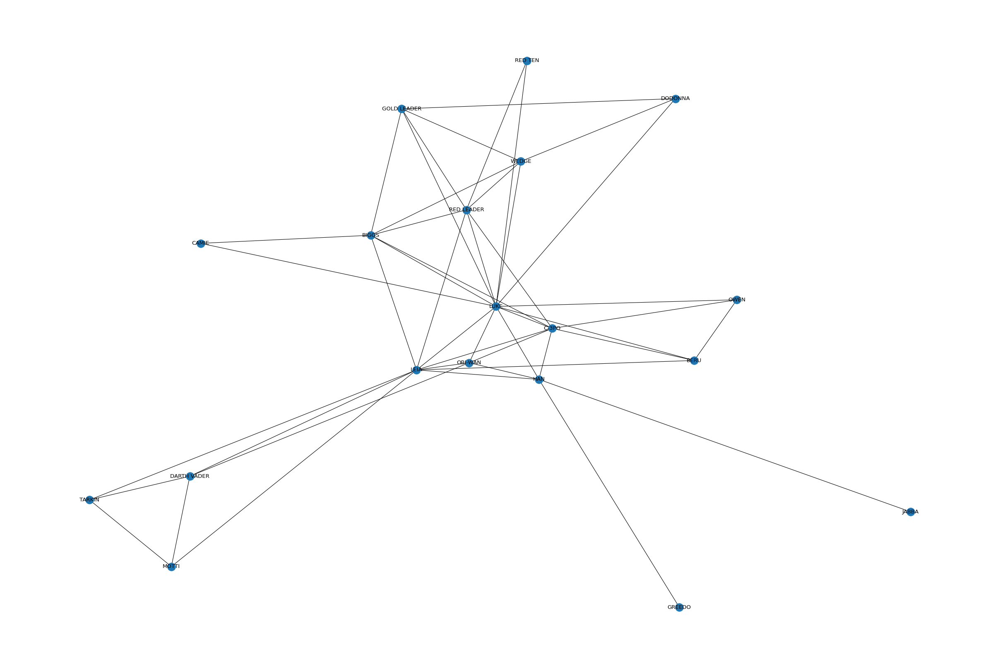

In [ ]:
graph_interactions_ep4 = nx.Graph()
extract_nodes_and_edges(graph_interactions_ep4, dataset_interactions_ep4)
graph_interactions_ep4.remove_node("GOLD FIVE")
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(graph_interactions_ep4, with_labels=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


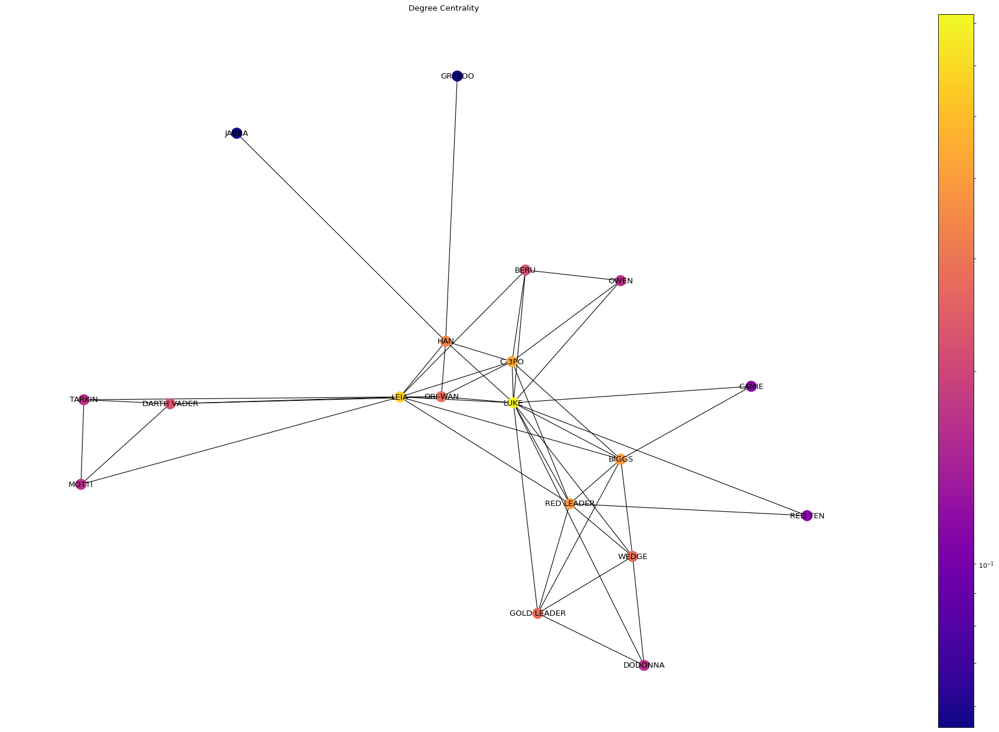

In [ ]:
pos_ep4 = nx.spring_layout(graph_interactions_ep4)
plt.figure(num=None, figsize=(30, 20), dpi=80)
degree_ep4 = nx.degree_centrality(graph_interactions_ep4)
draw(graph_interactions_ep4, pos_ep4, degree_ep4, 'Degree Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
 <a list of 9 Text major ticklabel objects>)

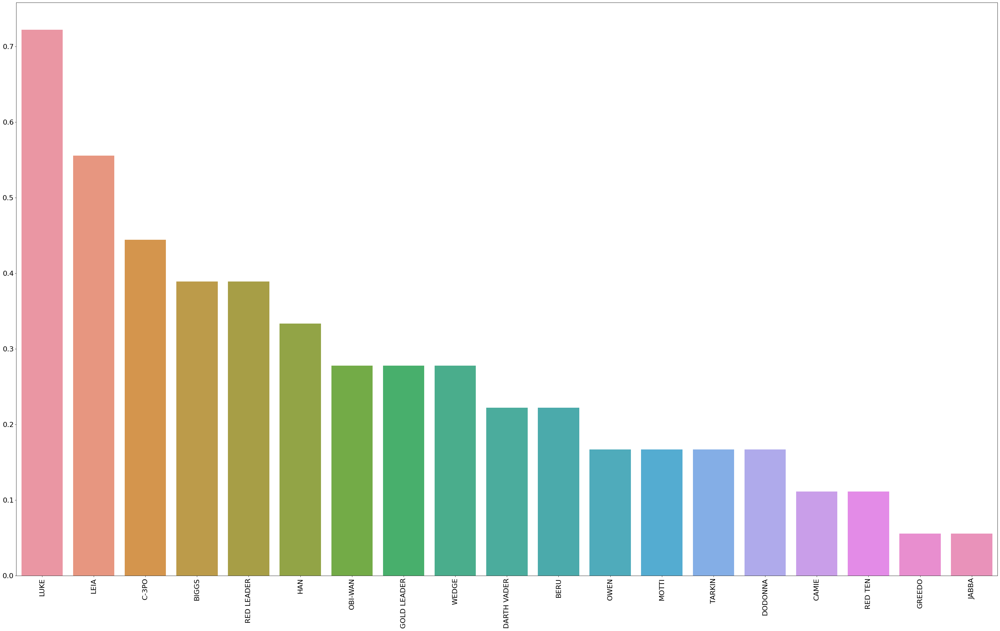

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_degree_ep4 = dict(sorted(degree_ep4.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_degree_ep4.keys()), list(sort_degree_ep4.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


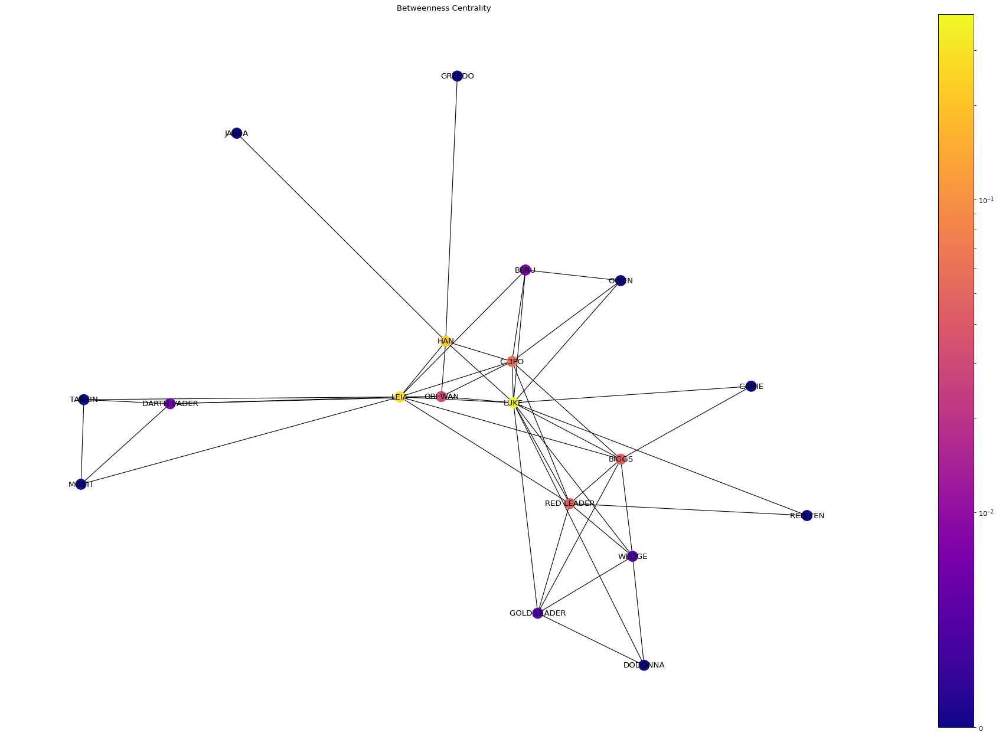

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
bet_ep4 = nx.betweenness_centrality(graph_interactions_ep4)
draw(graph_interactions_ep4, pos_ep4, bet_ep4, 'Betweenness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45]),
 <a list of 10 Text major ticklabel objects>)

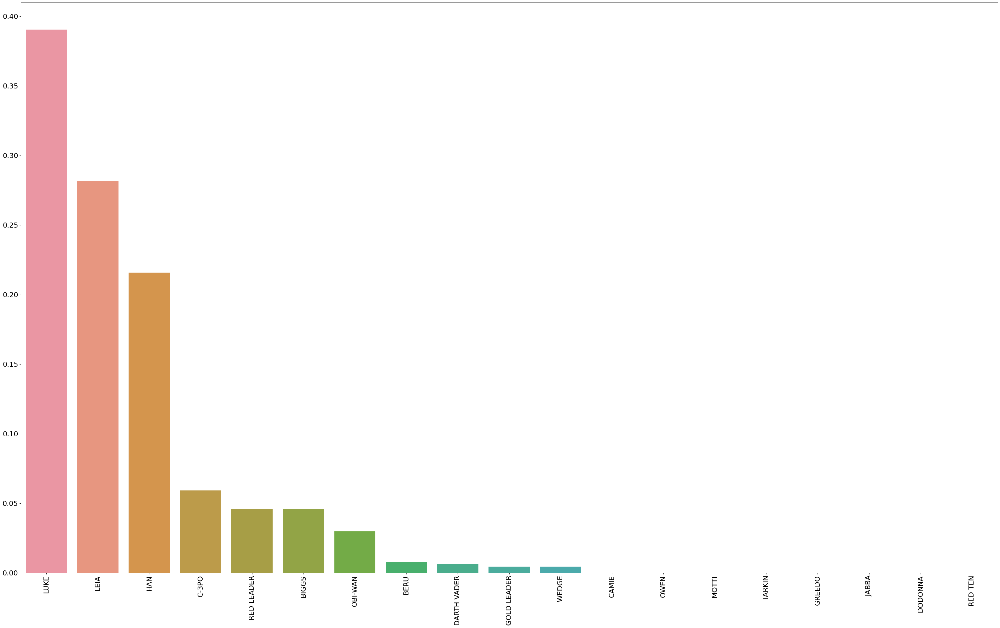

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_bet_ep4 = dict(sorted(bet_ep4.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_bet_ep4.keys()), list(sort_bet_ep4.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


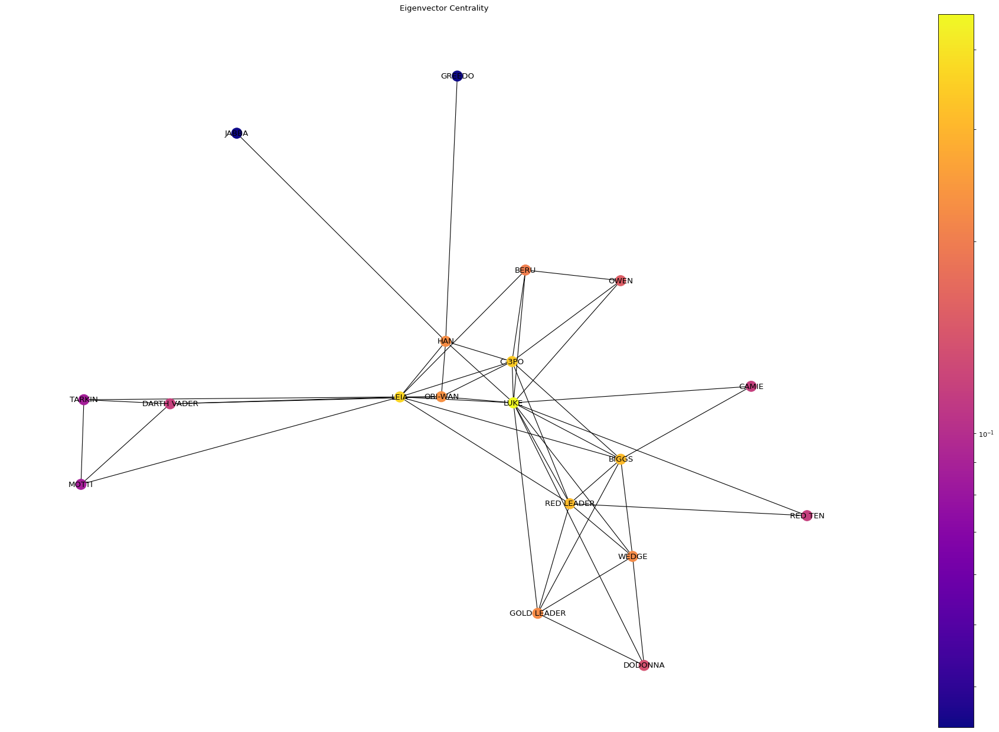

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
eig_ep4 = nx.eigenvector_centrality(graph_interactions_ep4)
draw(graph_interactions_ep4, pos_ep4, eig_ep4, 'Eigenvector Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5]),
 <a list of 6 Text major ticklabel objects>)

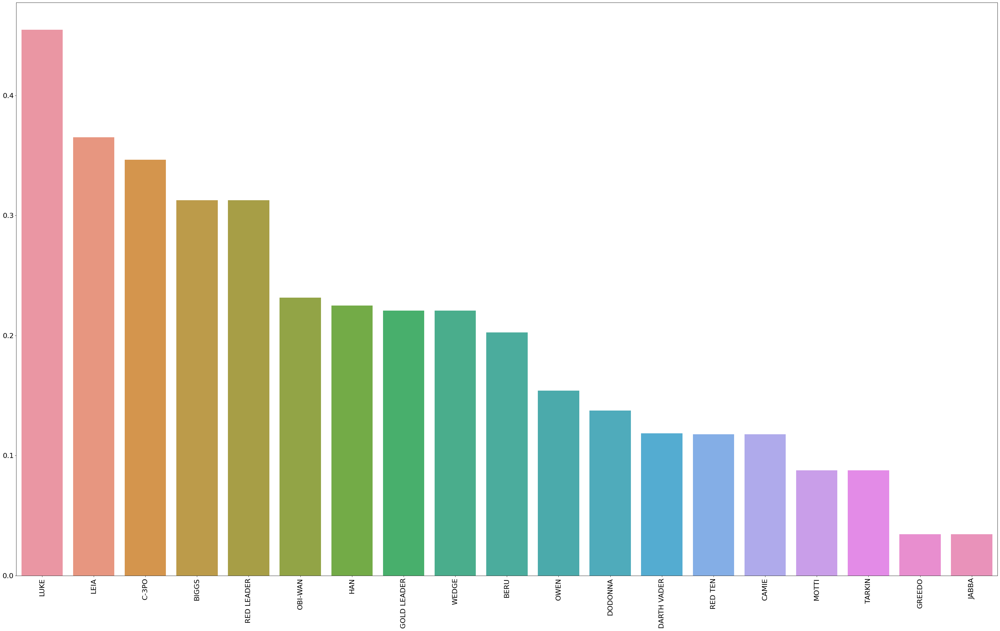

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_eig_ep4 = dict(sorted(eig_ep4.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_eig_ep4.keys()), list(sort_eig_ep4.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


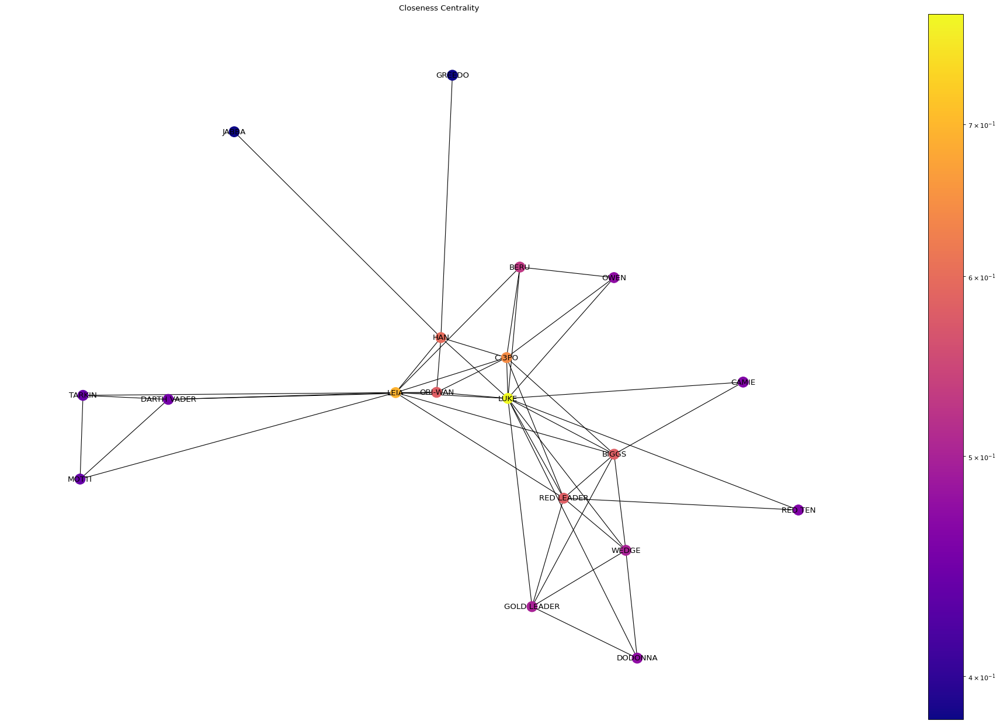

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
close_ep4 = nx.closeness_centrality(graph_interactions_ep4)
draw(graph_interactions_ep4, pos_ep4, close_ep4, 'Closeness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 <a list of 10 Text major ticklabel objects>)

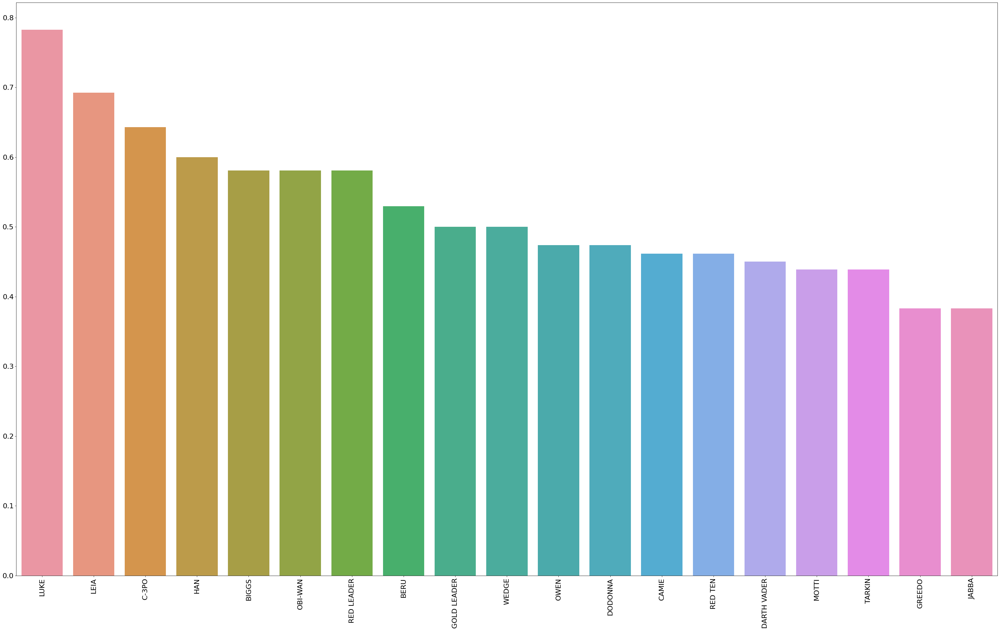

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_close_ep4 = dict(sorted(close_ep4.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_close_ep4.keys()), list(sort_close_ep4.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

## Episodio 5

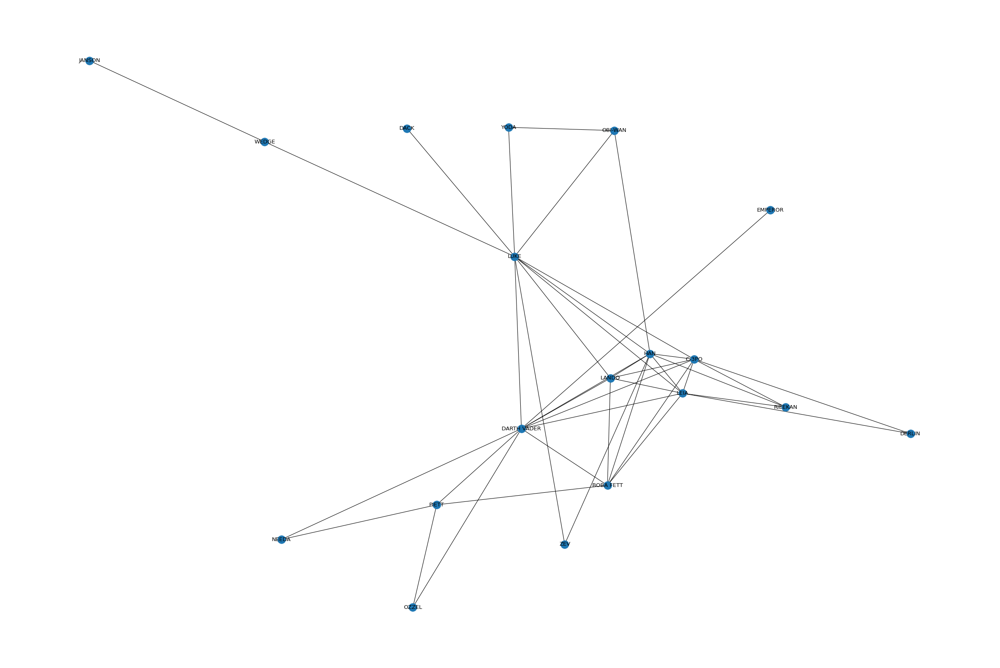

In [ ]:
graph_interactions_ep5 = nx.Graph()
extract_nodes_and_edges(graph_interactions_ep5, dataset_interactions_ep5)
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(graph_interactions_ep5, with_labels=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


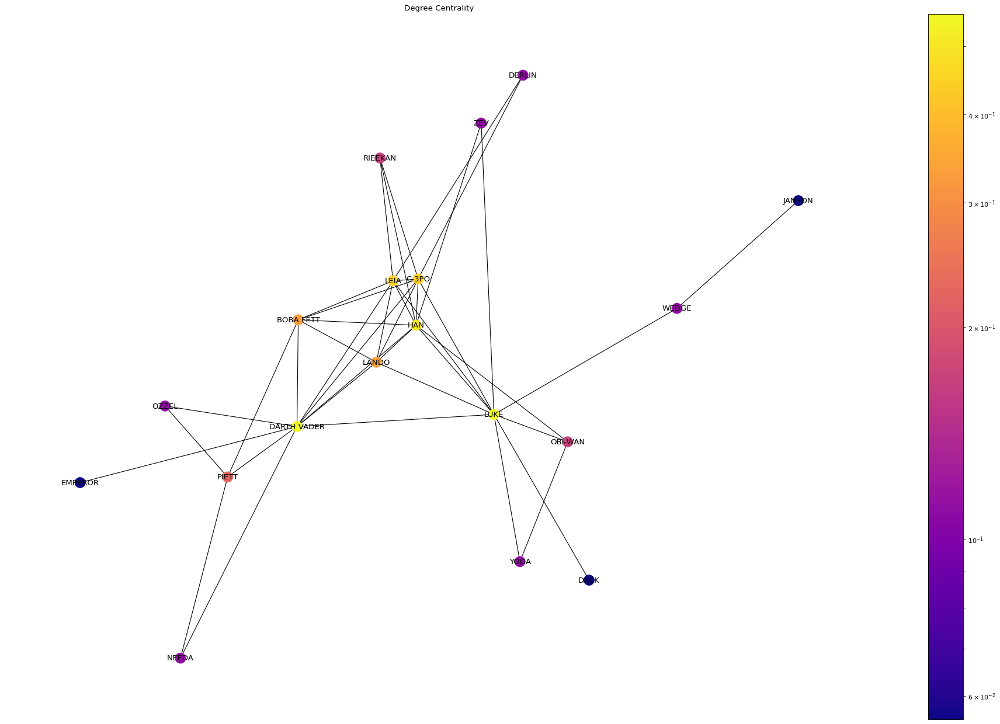

In [ ]:
pos_ep5 = nx.spring_layout(graph_interactions_ep5)
plt.figure(num=None, figsize=(30, 20), dpi=80)
degree_ep5 = nx.degree_centrality(graph_interactions_ep5)
draw(graph_interactions_ep5, pos_ep5, degree_ep5, 'Degree Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]),
 <a list of 7 Text major ticklabel objects>)

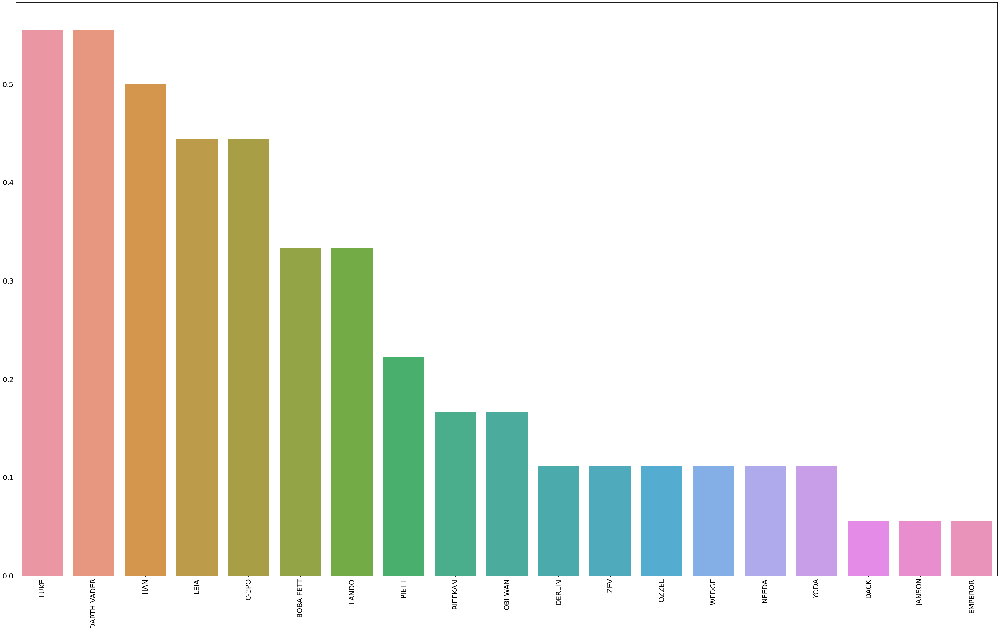

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_degree_ep5 = dict(sorted(degree_ep5.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_degree_ep5.keys()), list(sort_degree_ep5.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


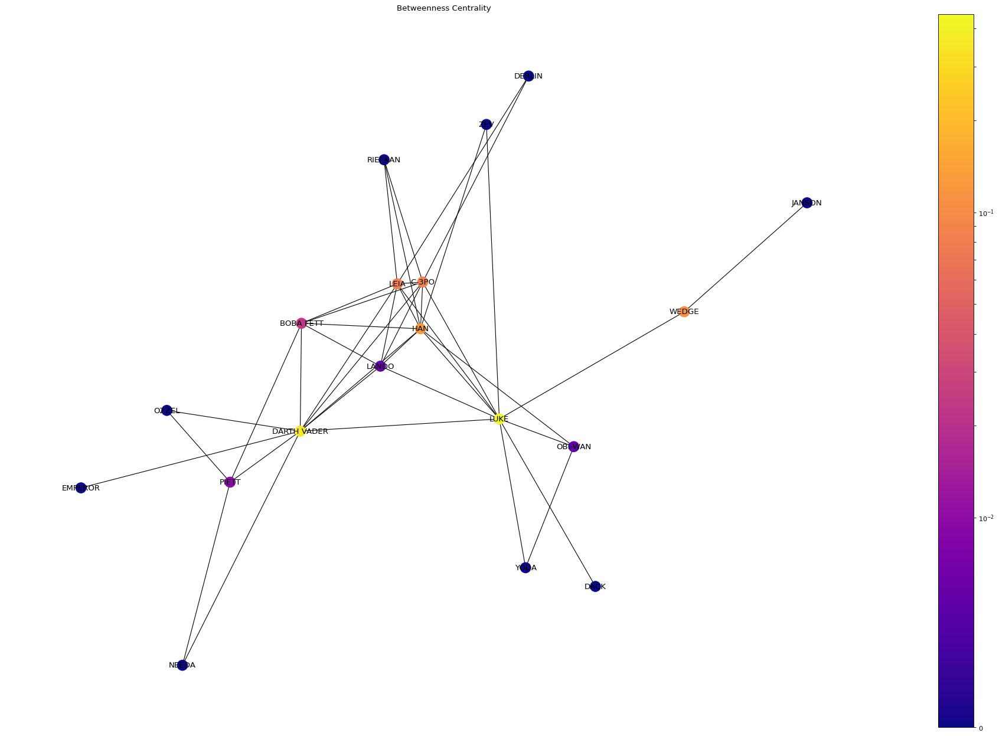

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
bet_ep5 = nx.betweenness_centrality(graph_interactions_ep5)
draw(graph_interactions_ep5, pos_ep5, bet_ep5, 'Betweenness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5]),
 <a list of 6 Text major ticklabel objects>)

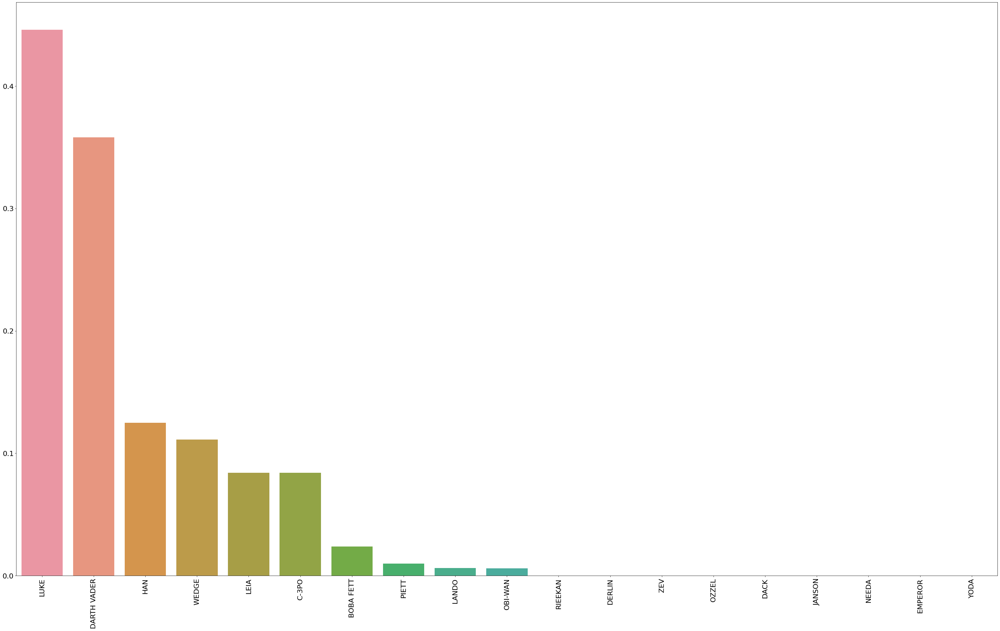

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_bet_ep5 = dict(sorted(bet_ep5.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_bet_ep5.keys()), list(sort_bet_ep5.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


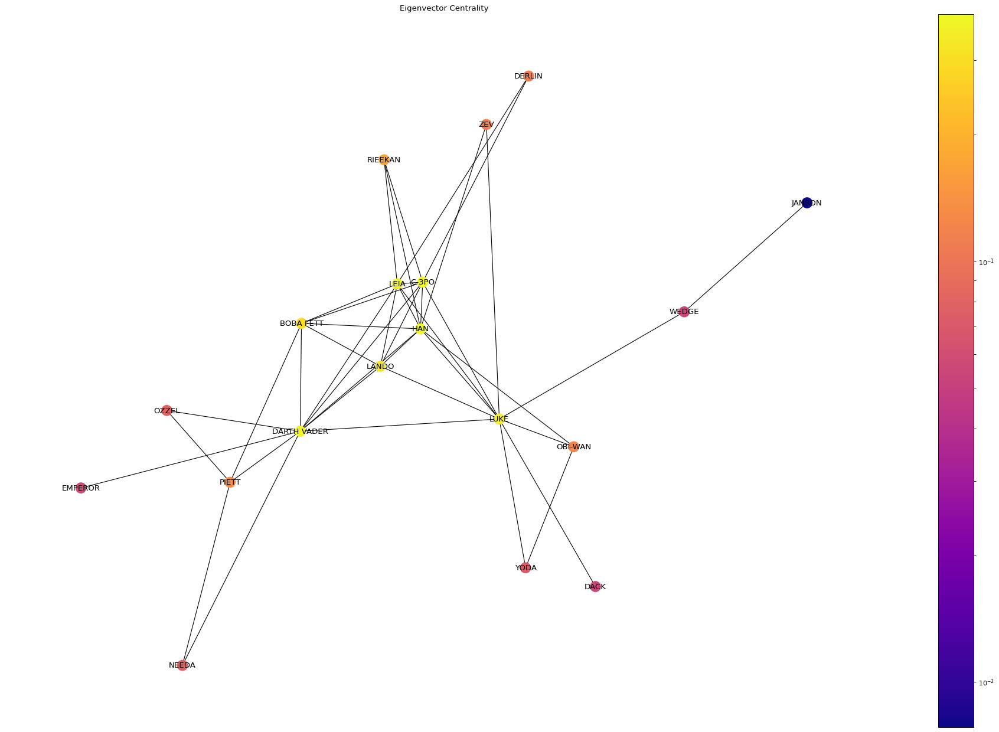

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
eig_ep5 = nx.eigenvector_centrality(graph_interactions_ep5)
draw(graph_interactions_ep5, pos_ep5, eig_ep5, 'Eigenvector Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45]),
 <a list of 10 Text major ticklabel objects>)

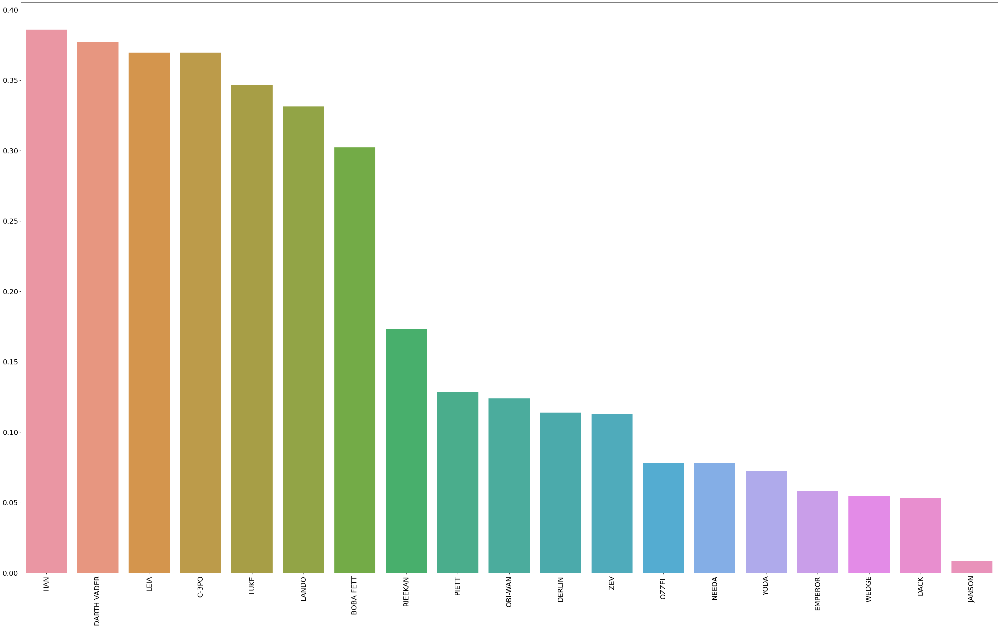

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_eig_ep5 = dict(sorted(eig_ep5.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_eig_ep5.keys()), list(sort_eig_ep5.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


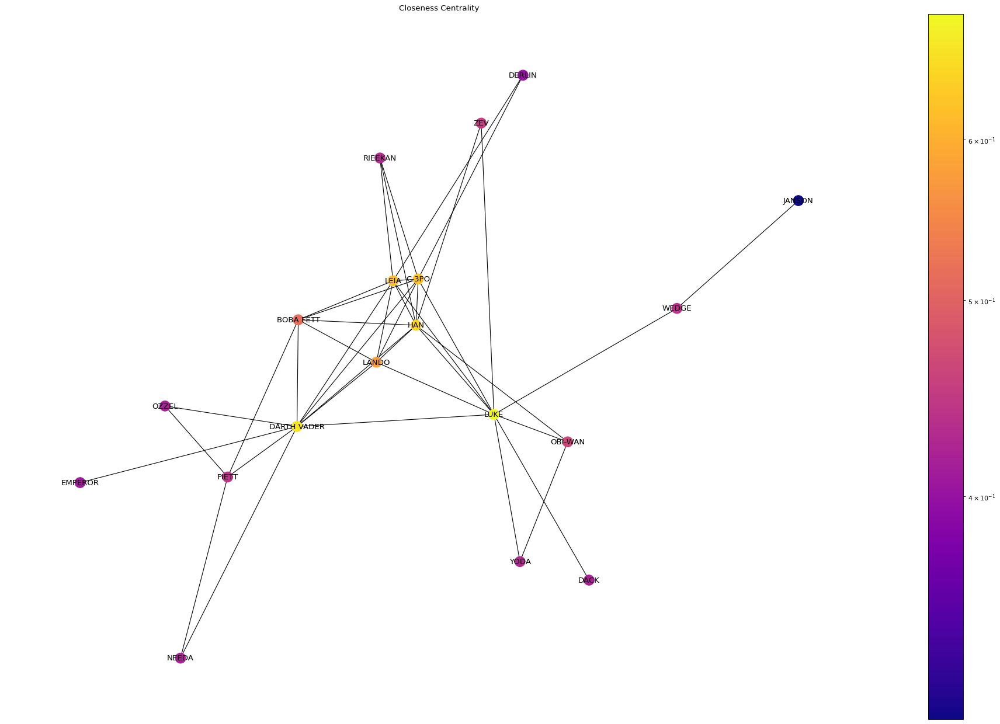

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
close_ep5 = nx.closeness_centrality(graph_interactions_ep5)
draw(graph_interactions_ep5, pos_ep5, close_ep5, 'Closeness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
 <a list of 9 Text major ticklabel objects>)

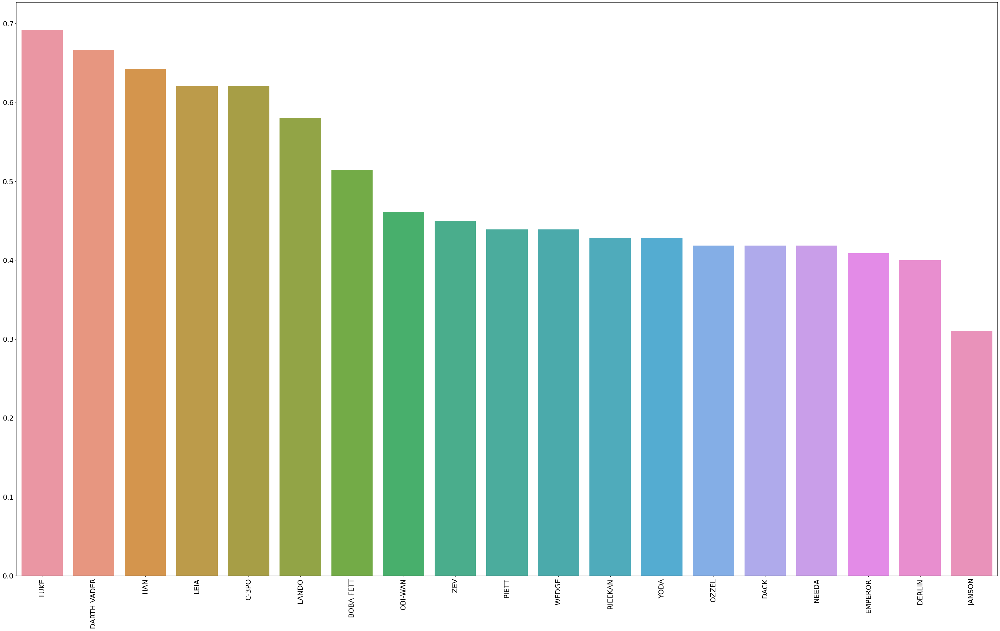

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_close_ep5 = dict(sorted(close_ep5.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_close_ep5.keys()), list(sort_close_ep5.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

## Episodio 6

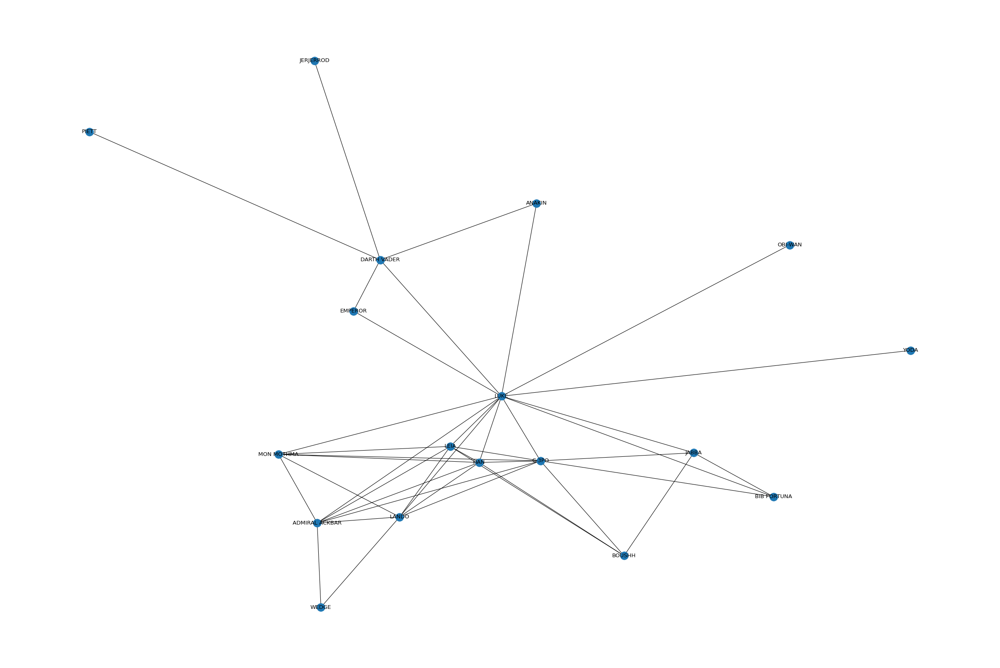

In [ ]:
graph_interactions_ep6 = nx.Graph()
extract_nodes_and_edges(graph_interactions_ep6, dataset_interactions_ep6)
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(graph_interactions_ep6, with_labels=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


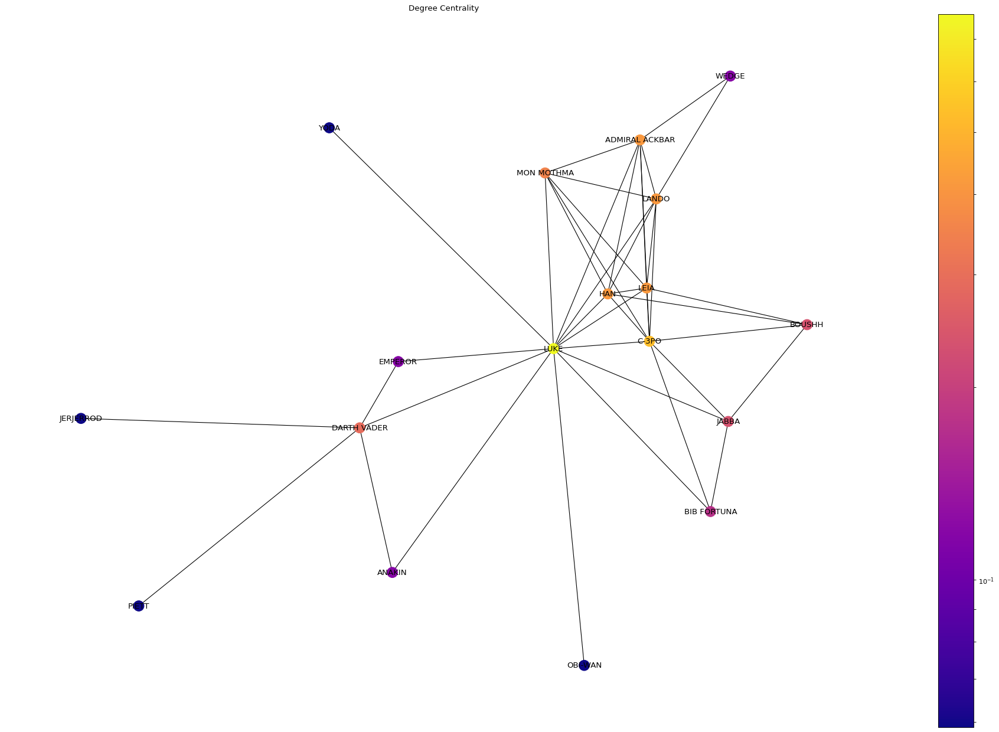

In [ ]:
pos_ep6 = nx.spring_layout(graph_interactions_ep6)
plt.figure(num=None, figsize=(30, 20), dpi=80)
degree_ep6 = nx.degree_centrality(graph_interactions_ep6)
draw(graph_interactions_ep6, pos_ep6, degree_ep6, 'Degree Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 <a list of 10 Text major ticklabel objects>)

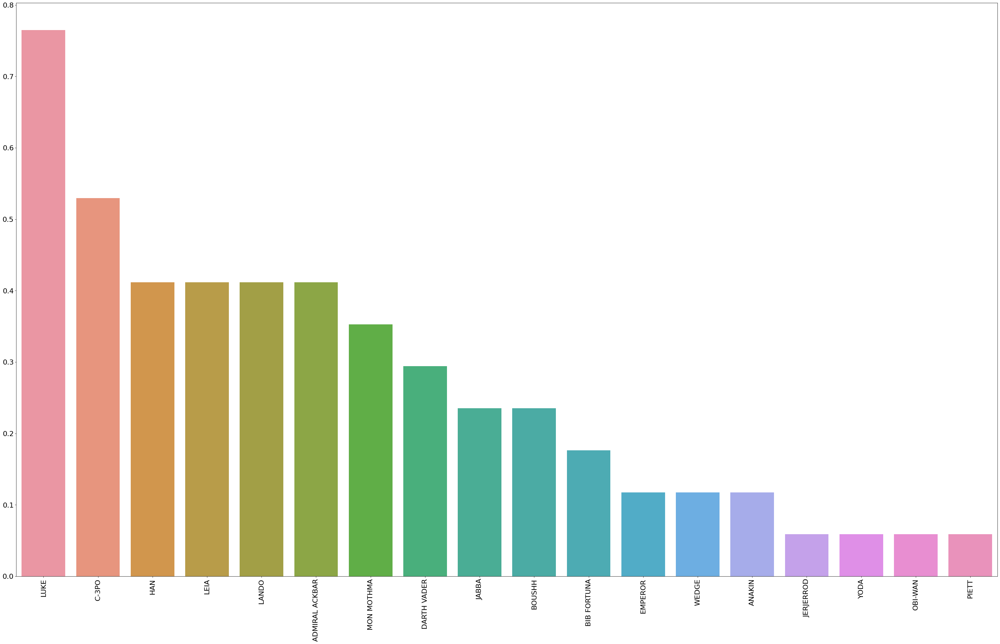

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_degree_ep6 = dict(sorted(degree_ep6.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_degree_ep6.keys()), list(sort_degree_ep6.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


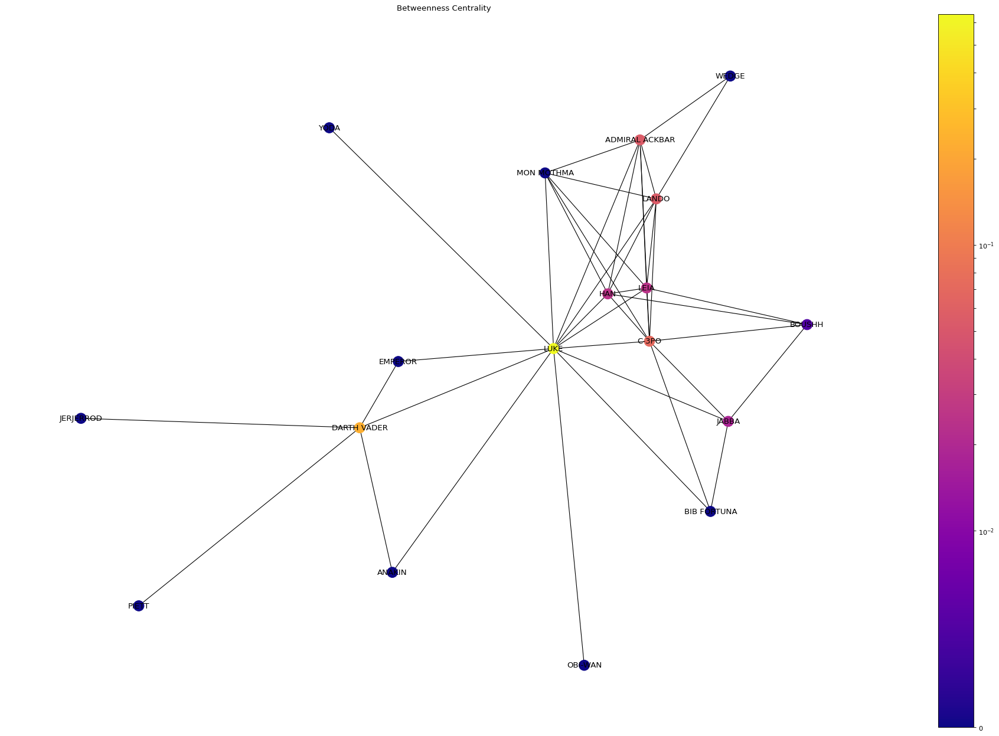

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
bet_ep6 = nx.betweenness_centrality(graph_interactions_ep6)
draw(graph_interactions_ep6, pos_ep6, bet_ep6, 'Betweenness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]),
 <a list of 8 Text major ticklabel objects>)

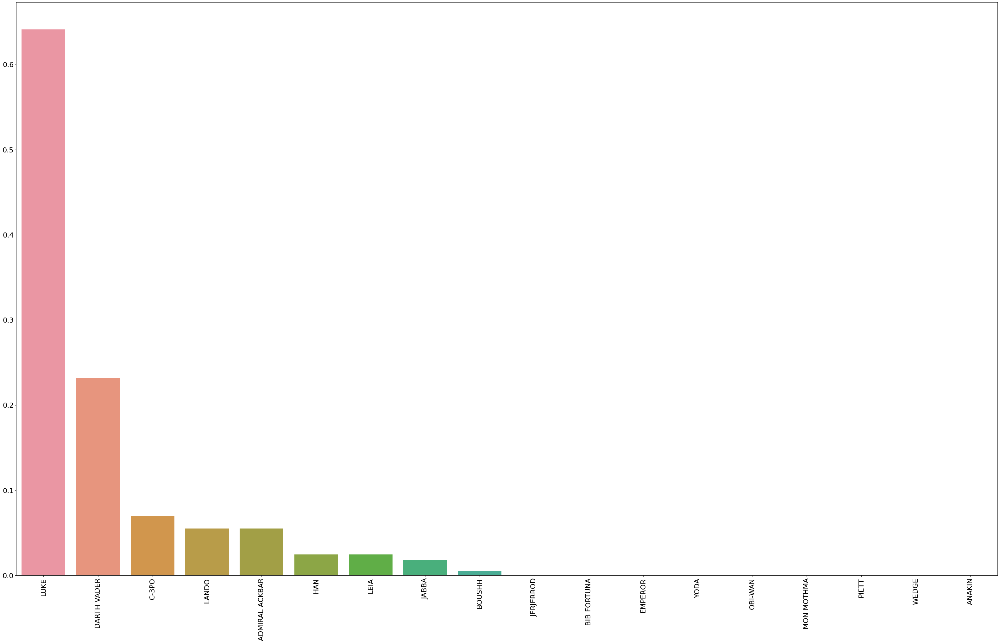

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_bet_ep6 = dict(sorted(bet_ep6.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_bet_ep6.keys()), list(sort_bet_ep6.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


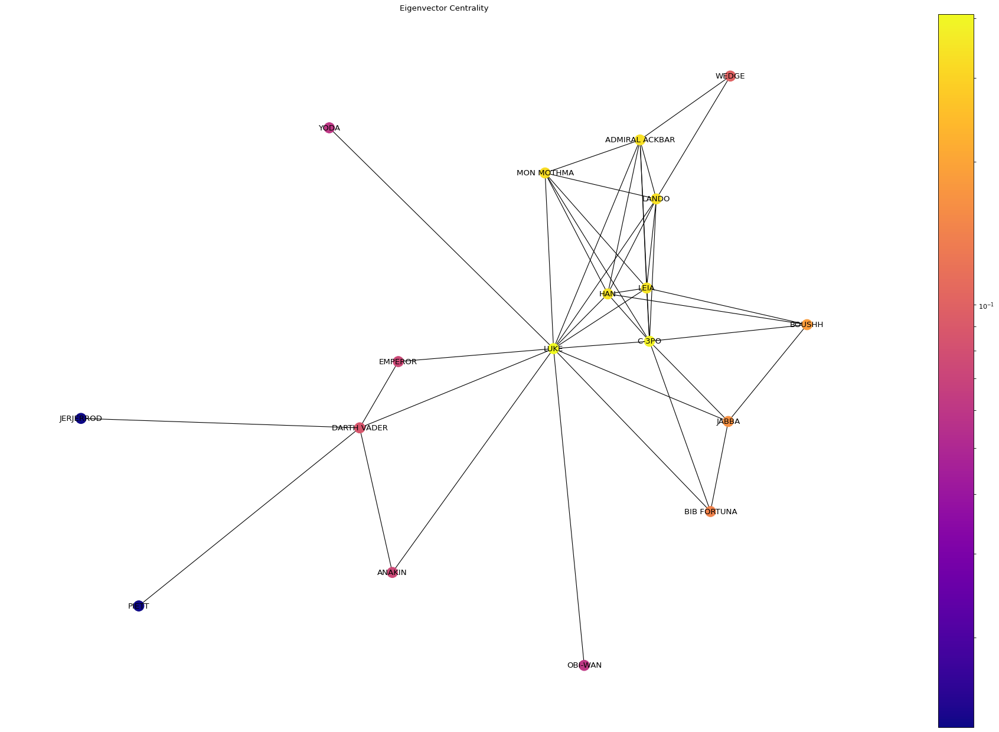

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
eig_ep6 = nx.eigenvector_centrality(graph_interactions_ep6)
draw(graph_interactions_ep6, pos_ep6, eig_ep6, 'Eigenvector Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45]),
 <a list of 10 Text major ticklabel objects>)

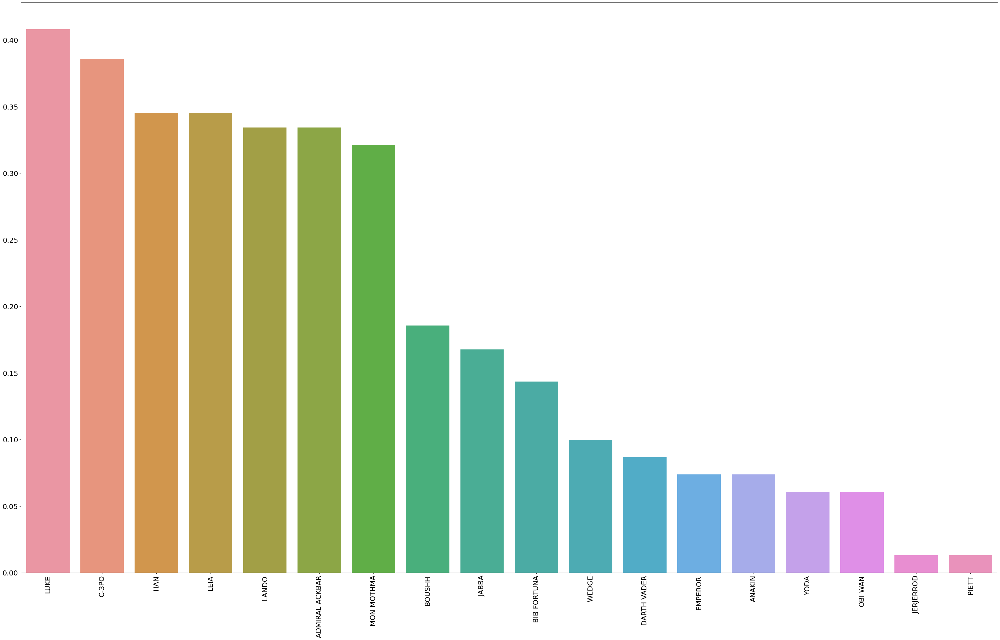

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_eig_ep6 = dict(sorted(eig_ep6.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_eig_ep6.keys()), list(sort_eig_ep6.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.
  


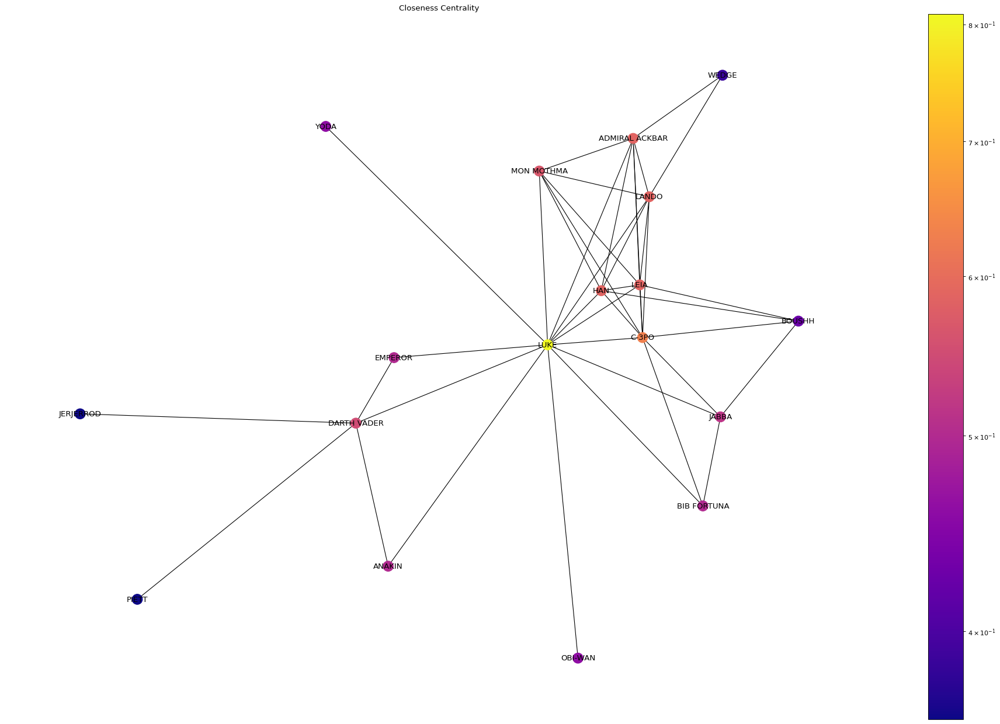

In [ ]:
plt.figure(num=None, figsize=(30, 20), dpi=80)
close_ep6 = nx.closeness_centrality(graph_interactions_ep6)
draw(graph_interactions_ep6, pos_ep6, close_ep6, 'Closeness Centrality', True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 <a list of 10 Text major ticklabel objects>)

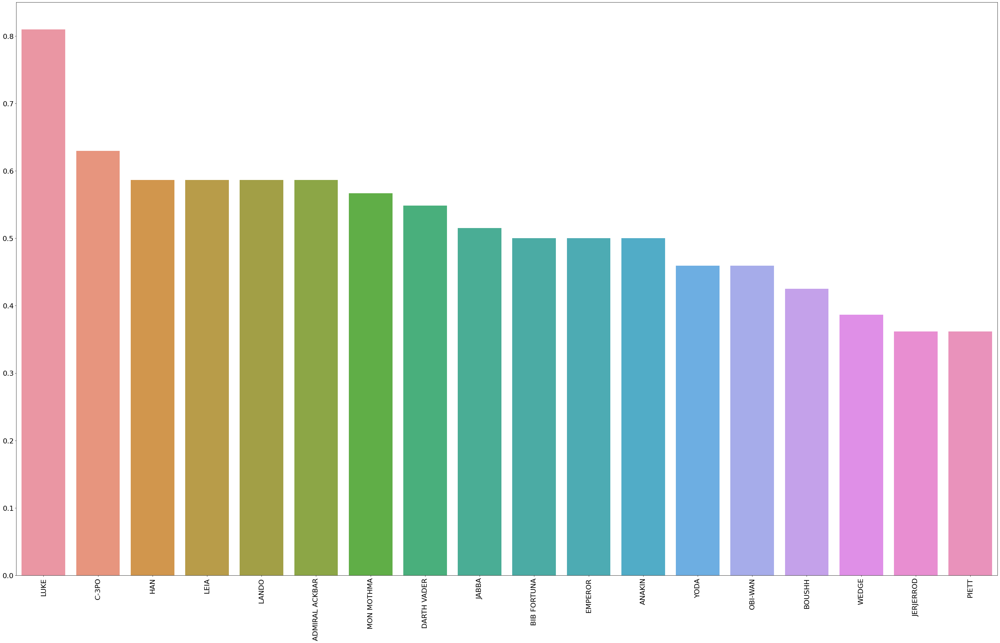

In [ ]:
plt.figure(num=None, figsize=(50, 30), dpi=80)
sort_close_ep6 = dict(sorted(close_ep6.items(), key= lambda x: x[1], reverse = True))
sns.barplot(list(sort_close_ep6.keys()), list(sort_close_ep6.values()))
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

## Grafo Trilogia Sequel

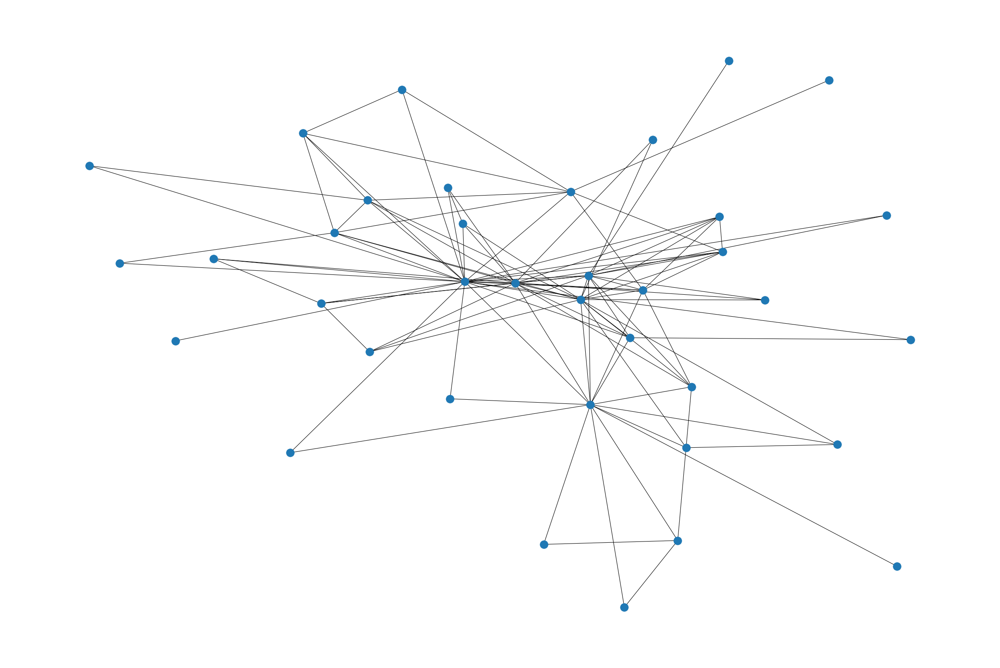

In [ ]:
graph_mid_sequel=nx.compose(graph_interactions_ep4, graph_interactions_ep5)
graph_sequel=nx.compose(graph_mid_sequel, graph_interactions_ep6)
plt.figure(num=None, figsize=(30, 20), dpi=80)
nx.draw(graph_sequel, with_labels=False)

In [ ]:
print("Numero di nodi:"+str(graph_sequel.number_of_nodes()))
print("Numero di archi:"+str(graph_sequel.number_of_edges()))
print("Raggio:"+str(nx.radius(graph_sequel)))
print("Diametro:"+str(nx.diameter(graph_sequel)))
print("Periferia:"+str(nx.periphery(graph_sequel)))
print("Centro:"+str(nx.center(graph_sequel)))

Numero di nodi:37
Numero di archi:103
Raggio:2
Diametro:4
Periferia:['MOTTI', 'TARKIN', 'GREEDO', 'RIEEKAN', 'DERLIN', 'PIETT', 'OZZEL', 'JANSON', 'NEEDA', 'JERJERROD', 'BOUSHH']
Centro:['LUKE', 'LANDO']
